# Important Libraries

In [2]:
# Standard libraries
import os
import numpy as np
import pandas as pd
import cv2
import multiprocessing as mp
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from collections import Counter
import random
import time
import lime
import lime.lime_tabular
import shap

from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from skimage.feature import hog, local_binary_pattern

# Scikit-learn libraries
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.decomposition import PCA, IncrementalPCA
from sklearn.model_selection import GridSearchCV, cross_val_score, train_test_split
from sklearn.ensemble import RandomForestClassifier, VotingClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.utils import resample
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.inspection import plot_partial_dependence
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.base import BaseEstimator, TransformerMixin

# Bayesian Optimization
from skopt import BayesSearchCV

# Keras and TensorFlow libraries
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img, save_img
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier

# Joblib for parallel processing
import joblib
from joblib import Parallel, delayed

# Data Augmentation

In [12]:
# Define the path to your data and the path where you want to save the augmented data
data_path = 'C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/segmented'
augmented_data_path = 'C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/augmented'

# Create the augmented data directory if it doesn't exist
if not os.path.exists(augmented_data_path):
    os.makedirs(augmented_data_path)

# Initialize the image data generator with chosen augmentations
datagen = ImageDataGenerator(
    rotation_range=315,    # Wide rotation range (from 0 to 315 degrees)
    zoom_range=0.05,       # Very mild zoom range (up to 5% zoom in or out)
    width_shift_range=0.1, # Mild width shift (up to 10% of image width)
    height_shift_range=0.1,# Mild height shift (up to 10% of image height)
    fill_mode='constant',  # Fill mode set to constant to fill with black
    cval=0,                # Fill value set to black
    horizontal_flip=False, # No horizontal flip
    vertical_flip=False    # No vertical flip
)

# Function to augment images
def augment_images(category_path, category_augmented_path):
    for img_name in os.listdir(category_path):
        img_path = os.path.join(category_path, img_name)
        img = load_img(img_path)
        x = img_to_array(img)
        x = x.reshape((1,) + x.shape)

        # Create directory for the augmented images if it doesn't exist
        if not os.path.exists(category_augmented_path):
            os.makedirs(category_augmented_path)

        # Augment each image exactly 3 times
        augmented_images_count = 0
        for batch in datagen.flow(x, batch_size=1):
            augmented_img_path = os.path.join(category_augmented_path, f'aug_{augmented_images_count}_{img_name}')
            save_img(augmented_img_path, batch[0])
            augmented_images_count += 1
            if augmented_images_count >= 3:
                break

# Iterate over each category directory in the dataset
for category in os.listdir(data_path):
    category_path = os.path.join(data_path, category)
    category_augmented_path = os.path.join(augmented_data_path, category)
    
    if os.path.isdir(category_path):
        augment_images(category_path, category_augmented_path)

print("Data augmentation completed!")

Data augmentation completed!


## Dimension Reduction

### 1. PCA

### 2. Auto encoders

### 3. Discrete Wavelet Transform (DWT)

## Feature Extraction Techniques

### 1. Histogram of Oriented Gradients (HOG)

### 2. Scale-Invariant Feature Transform (SIFT)

### 3. Local Binary Patterns (LBP)

### 4. Gabor Filters

# PCA + SVM

## 1. PCA

In [3]:
# Paths
data_path = 'C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/augmented'
image_size = (64, 64)  # Resize to 64x64
batch_size = 500  # Number of images per batch
n_components = 100  # Number of principal components

# Load images and labels in batches
def load_data_in_batches(data_path, image_size, batch_size):
    categories = os.listdir(data_path)
    images = []
    labels = []
    total_images = 0
    for category in categories:
        category_path = os.path.join(data_path, category)
        if os.path.isdir(category_path):
            img_names = os.listdir(category_path)
            for img_name in img_names:
                img_path = os.path.join(category_path, img_name)
                img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)  # Convert to grayscale
                if img is not None:
                    img = cv2.resize(img, image_size)  # Resize
                    images.append(img)
                    labels.append(category)
                    if len(images) >= batch_size:
                        yield np.array(images), np.array(labels)
                        total_images += len(images)
                        images, labels = [], []
    if images:
        yield np.array(images), np.array(labels)
        total_images += len(images)
    print(f"Total images loaded: {total_images}")

# Encode labels
label_encoder = LabelEncoder()
all_labels = [category for category in os.listdir(data_path)]
label_encoder.fit(all_labels)

# Load all data into memory
images_list = []
labels_list = []

for images_batch, labels_batch in tqdm(load_data_in_batches(data_path, image_size, batch_size), desc="Loading Data"):
    images_list.extend(images_batch)
    labels_list.extend(labels_batch)

images = np.array(images_list)
labels = np.array(label_encoder.transform(labels_list))

# Apply RandomUnderSampler to balance the data
rus = RandomUnderSampler(random_state=42)
images_resampled, labels_resampled = rus.fit_resample(images.reshape(len(images), -1), labels)

# Reshape images back to original dimensions
images_resampled = images_resampled.reshape(-1, image_size[0], image_size[1])

print(f"Images resampled shape: {images_resampled.shape}")
print(f"Labels resampled shape: {labels_resampled.shape}")

Loading Data: 326it [01:41,  3.22it/s]


Total images loaded: 162918
Images resampled shape: (17328, 64, 64)
Labels resampled shape: (17328,)


In [4]:
# Split and standardize data
def split_and_standardize(images, labels):
    X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42)
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    return X_train, X_test, y_train, y_test

X_train, X_test, y_train, y_test = split_and_standardize(images_resampled.reshape(len(images_resampled), -1), labels_resampled)

print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}, y_test shape: {y_test.shape}")

X_train shape: (13862, 4096), y_train shape: (13862,)
X_test shape: (3466, 4096), y_test shape: (3466,)


In [5]:
# Fit and transform PCA
def fit_transform_pca(X_train, X_test, n_components):
    pca = PCA(n_components=n_components)
    X_train_pca = pca.fit_transform(X_train)
    X_test_pca = pca.transform(X_test)
    return X_train_pca, X_test_pca, pca

X_train_pca, X_test_pca, pca = fit_transform_pca(X_train, X_test, n_components)

print(f"X_train_pca shape: {X_train_pca.shape}, X_test_pca shape: {X_test_pca.shape}")

X_train_pca shape: (13862, 100), X_test_pca shape: (3466, 100)


Number of components explaining 70% variance: 31


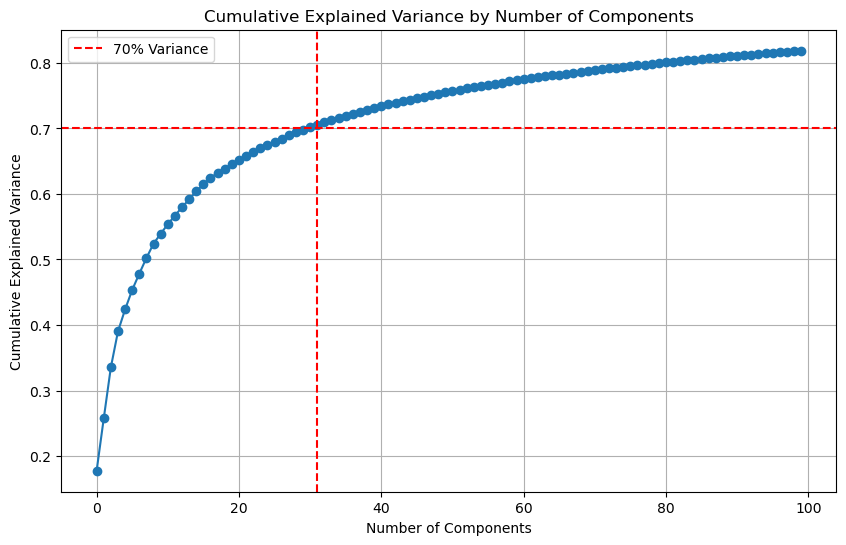

X_train_pca_70 shape: (13862, 31)
X_test_pca_70 shape: (3466, 31)


In [6]:
# Calculate cumulative explained variance
def calculate_cumulative_variance(pca):
    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    n_components_70 = np.argmax(cumulative_variance >= 0.70) + 1
    return cumulative_variance, n_components_70

cumulative_variance, n_components_70 = calculate_cumulative_variance(pca)
print(f"Number of components explaining 70% variance: {n_components_70}")

# Plot the cumulative explained variance
plt.figure(figsize=(10, 6))
plt.plot(cumulative_variance, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance by Number of Components')
plt.axhline(y=0.70, color='r', linestyle='--', label='70% Variance')
plt.axvline(x=n_components_70, color='r', linestyle='--')
plt.legend()
plt.grid()
plt.show()

# Transform data using the selected number of components for 70% variance
X_train_pca_70 = X_train_pca[:, :n_components_70]
X_test_pca_70 = X_test_pca[:, :n_components_70]

print(f"X_train_pca_70 shape: {X_train_pca_70.shape}")
print(f"X_test_pca_70 shape: {X_test_pca_70.shape}")


## 2. Train a Support Vector Machine (SVM)

In [7]:
# Function to train SVM with controlled parallel backend
def train_svm_with_progress(X_train, y_train, desc):
    print(f"Training {desc} with data shape: {X_train.shape}, labels shape: {y_train.shape}")
    svm = SVC(kernel='linear', random_state=42)
    start_time = time.time()
    
    # Use a controlled parallel backend
    with joblib.parallel_backend('threading', n_jobs=-1):
        svm.fit(X_train, y_train)
    
    end_time = time.time()
    print(f"Finished training {desc} in {end_time - start_time} seconds")
    return svm

# Train SVM for plant type using the selected components for 70% variance
svm_model = train_svm_with_progress(X_train_pca_70, y_train, "Plant Type SVM")

# Predict and evaluate the plant type model
y_pred = svm_model.predict(X_test_pca_70)
print(f"Plant Type Model Accuracy: {accuracy_score(y_test, y_pred)}")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))

Training Plant Type SVM with data shape: (13862, 31), labels shape: (13862,)
Finished training Plant Type SVM in 697.3443522453308 seconds
Plant Type Model Accuracy: 0.1768609347951529
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.16      0.12      0.14       106
                                 Apple___Black_rot       0.10      0.14      0.12        76
                          Apple___Cedar_apple_rust       0.06      0.08      0.07        93
                                   Apple___healthy       0.07      0.02      0.03        95
                               Blueberry___healthy       0.07      0.11      0.08        83
          Cherry_(including_sour)___Powdery_mildew       0.02      0.01      0.01        89
                 Cherry_(including_sour)___healthy       0.10      0.10      0.10        94
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.30      0.32      0

## 3. Optimize the Model

In [8]:
# Define a larger parameter grid
param_grid = {
    'C': [0.1, 1, 10, 100],
    'gamma': [1, 0.1, 0.01, 0.001],
    'kernel': ['linear', 'rbf', 'sigmoid'],
}

# Initialize the GridSearchCV with SVC and the parameter grid
grid_search = GridSearchCV(SVC(), param_grid, refit=True, verbose=2, cv=3)

# Use a controlled parallel backend
with joblib.parallel_backend('threading', n_jobs=-1):
    print("Starting Grid Search...")
    grid_search.fit(X_train_pca_70, y_train)
    print("Grid Search completed.")

# Get the best estimator
best_svc = grid_search.best_estimator_

# Make predictions
y_pred = best_svc.predict(X_test_pca_70)

# Evaluate the model
print(f"Optimized Plant Type Model Accuracy: {accuracy_score(y_test, y_pred)}")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))

Starting Grid Search...
Fitting 3 folds for each of 48 candidates, totalling 144 fits
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=  11.2s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=  12.2s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=  12.6s
[CV] END ...................C=0.1, gamma=0.1, kernel=sigmoid; total time=  14.1s
[CV] END ...................C=0.1, gamma=0.1, kernel=sigmoid; total time=  14.9s
[CV] END ...................C=0.1, gamma=0.1, kernel=sigmoid; total time=  15.7s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=  29.2s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=  29.6s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=  30.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=  31.7s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=  31.9s
[CV] END ..............

KeyboardInterrupt: 

## 4. Visualization Part

### Confusion Matrix

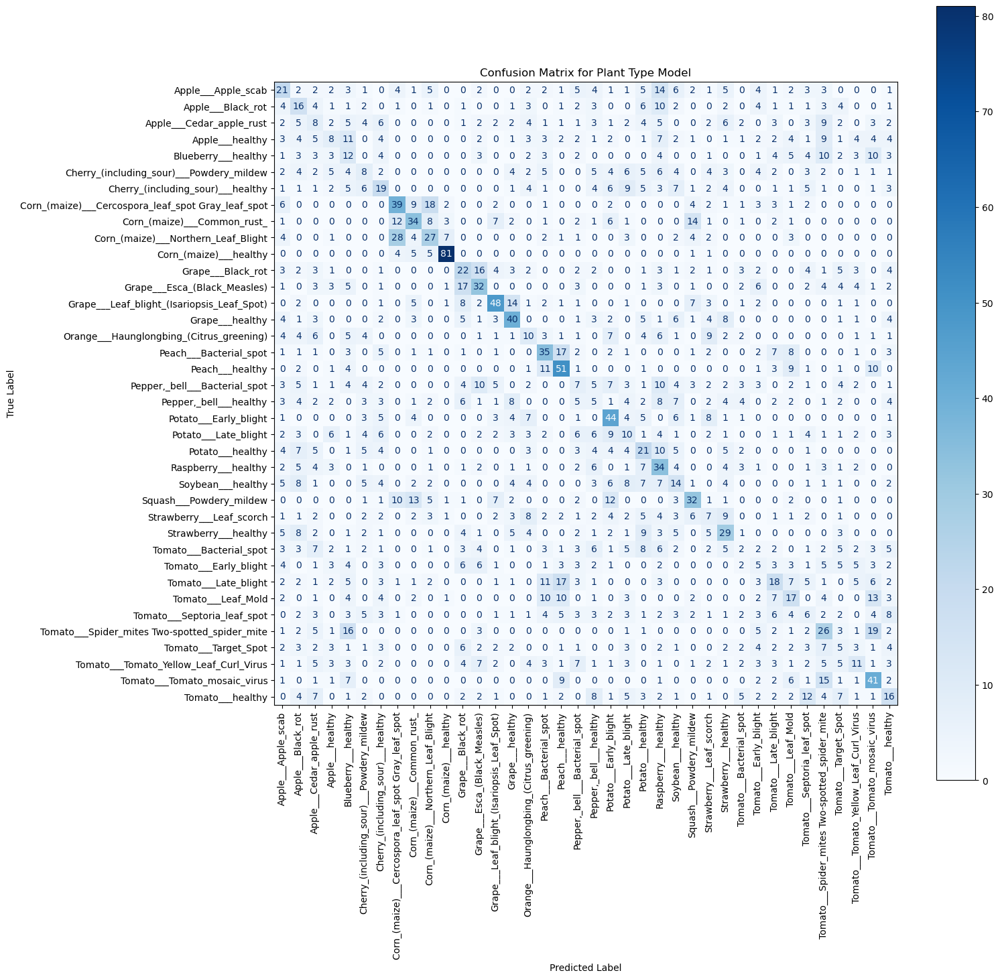

In [16]:

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix
fig, ax = plt.subplots(figsize=(15, 15))  # Increase the size of the figure
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=label_encoder.classes_)
disp.plot(cmap=plt.cm.Blues, ax=ax, xticks_rotation='vertical')
plt.title('Confusion Matrix for Plant Type Model')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks(rotation=90)
plt.show()

# PCA + SVM Segregated

## 1. Load data

In [2]:
# Paths
data_path = 'C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/augmented'
image_size = (64, 64)  # Resize to 64x64
batch_size = 500  # Number of images per batch

# Load images and labels in batches
def load_data_in_batches(data_path, image_size, batch_size):
    categories = os.listdir(data_path)
    images = []
    labels = []
    total_images = 0
    for category in categories:
        category_path = os.path.join(data_path, category)
        if os.path.isdir(category_path):
            img_names = os.listdir(category_path)
            for img_name in img_names:
                img_path = os.path.join(category_path, img_name)
                img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)  # Convert to grayscale
                if img is not None:
                    img = cv2.resize(img, image_size)  # Resize
                    images.append(img)
                    labels.append(category)
                    if len(images) >= batch_size:
                        yield np.array(images), np.array(labels)
                        total_images += len(images)
                        images, labels = [], []
    if images:
        yield np.array(images), np.array(labels)
        total_images += len(images)
    print(f"Total images loaded: {total_images}")

# Initialize lists to hold images and labels
images_list = []
labels_list = []

# Load data into memory
for images_batch, labels_batch in tqdm(load_data_in_batches(data_path, image_size, batch_size), desc="Loading Data"):
    images_list.extend(images_batch)
    labels_list.extend(labels_batch)

images = np.array(images_list)
labels = np.array(labels_list)

print(f"Total images: {len(images)}")
print(f"Total labels: {len(labels)}")

# Function to limit the sample size without exceeding the original class count
def limit_samples(X, y, max_samples=20000):
    class_counts = np.bincount(y)
    max_class_samples = min(max_samples // len(np.unique(y)), min(class_counts))
    sampling_strategy = {i: min(max_class_samples, count) for i, count in enumerate(class_counts)}
    rus = RandomUnderSampler(sampling_strategy=sampling_strategy, random_state=42)
    X_resampled, y_resampled = rus.fit_resample(X, y)
    return X_resampled, y_resampled

# Stage 1: Plant Type Classification
plant_labels = [label.split('___')[0] for label in labels]
plant_label_encoder = LabelEncoder()
plant_labels_encoded = plant_label_encoder.fit_transform(plant_labels)
images_resampled_plant, plant_labels_resampled = limit_samples(images.reshape(len(images), -1), plant_labels_encoded)
images_resampled_plant = images_resampled_plant.reshape(-1, image_size[0], image_size[1])

# Stage 2: Healthy vs Disease Classification
health_labels = ['healthy' if 'healthy' in label else 'disease' for label in labels]
health_label_encoder = LabelEncoder()
health_labels_encoded = health_label_encoder.fit_transform(health_labels)
images_resampled_health, health_labels_resampled = limit_samples(images.reshape(len(images), -1), health_labels_encoded)
images_resampled_health = images_resampled_health.reshape(-1, image_size[0], image_size[1])

# Stage 3: Disease Classification (excluding healthy samples)
disease_labels = [label.split('___')[1] if '___' in label else 'healthy' for label in labels]
disease_label_encoder = LabelEncoder()
disease_labels_encoded = disease_label_encoder.fit_transform(disease_labels)
images_resampled_disease, disease_labels_resampled = limit_samples(images.reshape(len(images), -1), disease_labels_encoded)
images_resampled_disease = images_resampled_disease.reshape(-1, image_size[0], image_size[1])

print(f"Resampled images for plant type classification: {images_resampled_plant.shape}")
print(f"Resampled images for healthy vs disease classification: {images_resampled_health.shape}")
print(f"Resampled images for disease classification: {images_resampled_disease.shape}")

n_components = 100  # Number of principal components

Loading Data: 326it [00:50,  6.41it/s]


Total images loaded: 162918
Total images: 162918
Total labels: 162918
Resampled images for plant type classification: (15582, 64, 64)
Resampled images for healthy vs disease classification: (20000, 64, 64)
Resampled images for disease classification: (17325, 64, 64)


In [3]:
# Split and standardize data
def split_and_standardize(images, labels):
    X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42)
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    return X_train, X_test, y_train, y_test

# Process for each classification stage
X_train_plant, X_test_plant, y_train_plant, y_test_plant = split_and_standardize(images_resampled_plant.reshape(len(images_resampled_plant), -1), plant_labels_resampled)
X_train_health, X_test_health, y_train_health, y_test_health = split_and_standardize(images_resampled_health.reshape(len(images_resampled_health), -1), health_labels_resampled)
X_train_disease, X_test_disease, y_train_disease, y_test_disease = split_and_standardize(images_resampled_disease.reshape(len(images_resampled_disease), -1), disease_labels_resampled)

print(f"X_train_plant shape: {X_train_plant.shape}, y_train_plant shape: {y_train_plant.shape}")
print(f"X_test_plant shape: {X_test_plant.shape}, y_test_plant shape: {y_test_plant.shape}")

print(f"X_train_health shape: {X_train_health.shape}, y_train_health shape: {y_train_health.shape}")
print(f"X_test_health shape: {X_test_health.shape}, y_test_health shape: {y_test_health.shape}")

print(f"X_train_disease shape: {X_train_disease.shape}, y_train_disease shape: {y_train_disease.shape}")
print(f"X_test_disease shape: {X_test_disease.shape}, y_test_disease shape: {y_test_disease.shape}")

X_train_plant shape: (12465, 4096), y_train_plant shape: (12465,)
X_test_plant shape: (3117, 4096), y_test_plant shape: (3117,)
X_train_health shape: (16000, 4096), y_train_health shape: (16000,)
X_test_health shape: (4000, 4096), y_test_health shape: (4000,)
X_train_disease shape: (13860, 4096), y_train_disease shape: (13860,)
X_test_disease shape: (3465, 4096), y_test_disease shape: (3465,)


## 2. PCA

In [4]:
# Fit and transform PCA within split_and_standardize
def fit_transform_pca(X_train, X_test, n_components):
    pca = PCA(n_components=n_components)
    X_train_pca = pca.fit_transform(X_train)
    X_test_pca = pca.transform(X_test)
    return X_train_pca, X_test_pca, pca

X_train_plant_pca, X_test_plant_pca, pca_plant = fit_transform_pca(X_train_plant, X_test_plant, n_components)
X_train_health_pca, X_test_health_pca, pca_health = fit_transform_pca(X_train_health, X_test_health, n_components)
X_train_disease_pca, X_test_disease_pca, pca_disease = fit_transform_pca(X_train_disease, X_test_disease, n_components)

print(f"X_train_plant_pca shape: {X_train_plant_pca.shape}, X_test_plant_pca shape: {X_test_plant_pca.shape}")
print(f"X_train_health_pca shape: {X_train_health_pca.shape}, X_test_health_pca shape: {X_test_health_pca.shape}")
print(f"X_train_disease_pca shape: {X_train_disease_pca.shape}, X_test_disease_pca shape: {X_test_disease_pca.shape}")

X_train_plant_pca shape: (12465, 100), X_test_plant_pca shape: (3117, 100)
X_train_health_pca shape: (16000, 100), X_test_health_pca shape: (4000, 100)
X_train_disease_pca shape: (13860, 100), X_test_disease_pca shape: (3465, 100)


Number of components explaining 70% variance for Plant Type: 29
Number of components explaining 70% variance for Health: 29
Number of components explaining 70% variance for Disease: 34


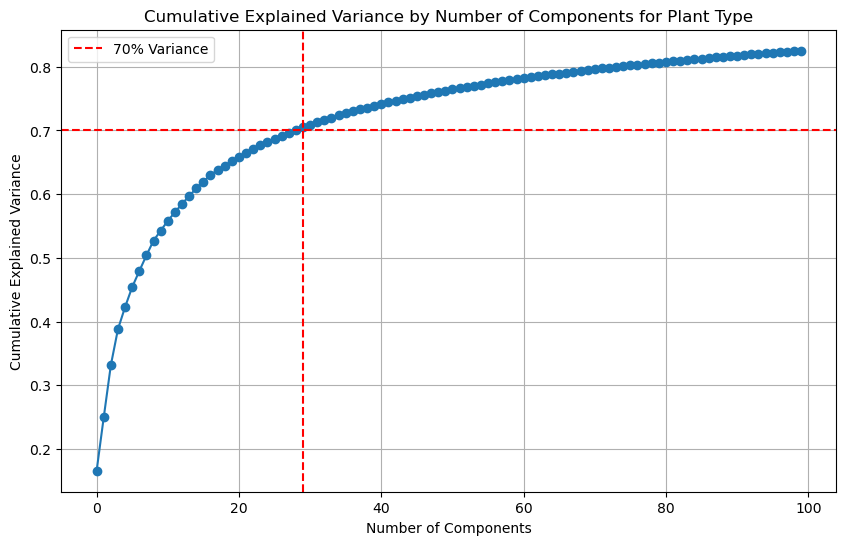

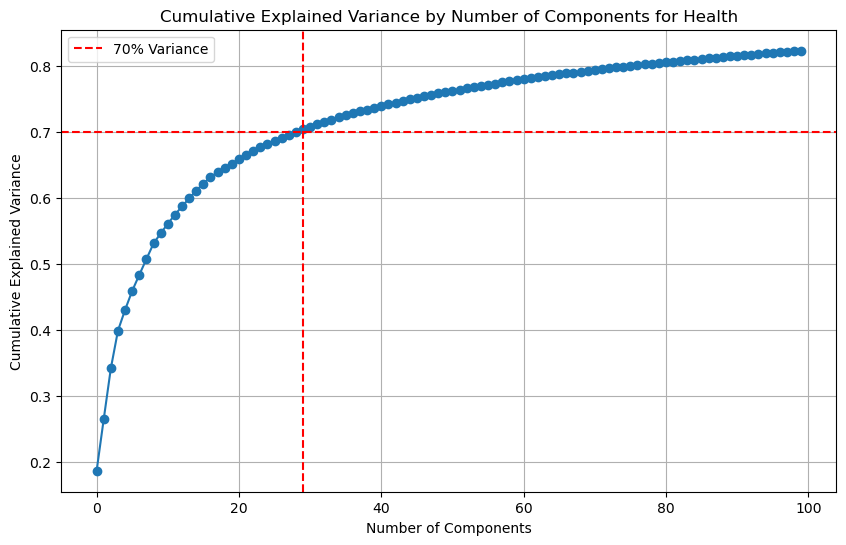

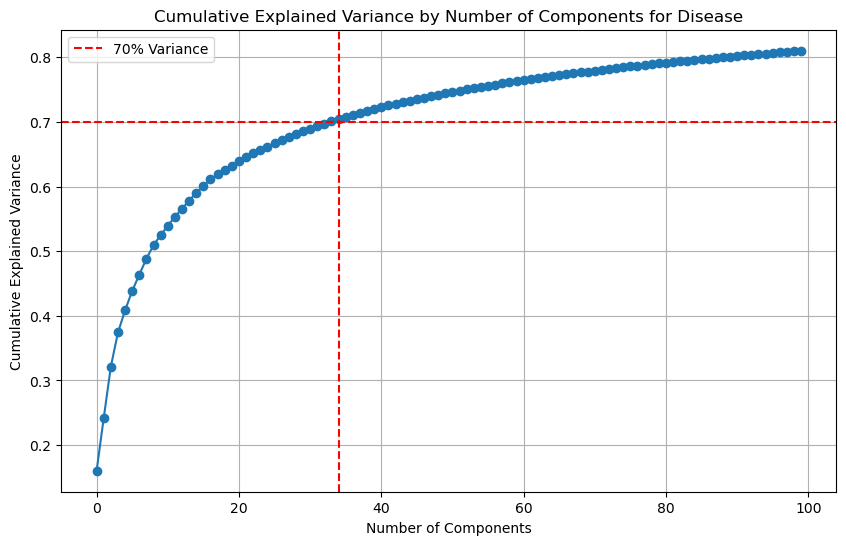

X_train_plant_pca_70 shape: (12465, 29), X_test_plant_pca_70 shape: (3117, 29)
X_train_health_pca_70 shape: (16000, 29), X_test_health_pca_70 shape: (4000, 29)
X_train_disease_pca_70 shape: (13860, 34), X_test_disease_pca_70 shape: (3465, 34)


In [5]:
# Calculate cumulative explained variance
def calculate_cumulative_variance(pca):
    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    n_components_70 = np.argmax(cumulative_variance >= 0.70) + 1
    return cumulative_variance, n_components_70

# Plant Type PCA
cumulative_variance_plant, n_components_70_plant = calculate_cumulative_variance(pca_plant)
print(f"Number of components explaining 70% variance for Plant Type: {n_components_70_plant}")

# Health PCA
cumulative_variance_health, n_components_70_health = calculate_cumulative_variance(pca_health)
print(f"Number of components explaining 70% variance for Health: {n_components_70_health}")

# Disease PCA
cumulative_variance_disease, n_components_70_disease = calculate_cumulative_variance(pca_disease)
print(f"Number of components explaining 70% variance for Disease: {n_components_70_disease}")

# Plot the cumulative explained variance for Plant Type
plt.figure(figsize=(10, 6))
plt.plot(cumulative_variance_plant, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance by Number of Components for Plant Type')
plt.axhline(y=0.70, color='r', linestyle='--', label='70% Variance')
plt.axvline(x=n_components_70_plant, color='r', linestyle='--')
plt.legend()
plt.grid()
plt.show()

# Plot the cumulative explained variance for Health
plt.figure(figsize=(10, 6))
plt.plot(cumulative_variance_health, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance by Number of Components for Health')
plt.axhline(y=0.70, color='r', linestyle='--', label='70% Variance')
plt.axvline(x=n_components_70_health, color='r', linestyle='--')
plt.legend()
plt.grid()
plt.show()

# Plot the cumulative explained variance for Disease
plt.figure(figsize=(10, 6))
plt.plot(cumulative_variance_disease, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance by Number of Components for Disease')
plt.axhline(y=0.70, color='r', linestyle='--', label='70% Variance')
plt.axvline(x=n_components_70_disease, color='r', linestyle='--')
plt.legend()
plt.grid()
plt.show()

# Transform data using the selected number of components for 70% variance
X_train_plant_pca_70 = X_train_plant_pca[:, :n_components_70_plant]
X_test_plant_pca_70 = X_test_plant_pca[:, :n_components_70_plant]

X_train_health_pca_70 = X_train_health_pca[:, :n_components_70_health]
X_test_health_pca_70 = X_test_health_pca[:, :n_components_70_health]

X_train_disease_pca_70 = X_train_disease_pca[:, :n_components_70_disease]
X_test_disease_pca_70 = X_test_disease_pca[:, :n_components_70_disease]

print(f"X_train_plant_pca_70 shape: {X_train_plant_pca_70.shape}, X_test_plant_pca_70 shape: {X_test_plant_pca_70.shape}")
print(f"X_train_health_pca_70 shape: {X_train_health_pca_70.shape}, X_test_health_pca_70 shape: {X_test_health_pca_70.shape}")
print(f"X_train_disease_pca_70 shape: {X_train_disease_pca_70.shape}, X_test_disease_pca_70 shape: {X_test_disease_pca_70.shape}")

## 3. Train with SVM

Starting Grid Search...
Fitting 3 folds for each of 18 candidates, totalling 54 fits
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=  11.7s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=  11.8s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=  12.1s
[CV] END ...................C=0.1, gamma=0.1, kernel=sigmoid; total time=  13.7s
[CV] END ...................C=0.1, gamma=0.1, kernel=sigmoid; total time=  13.8s
[CV] END ...................C=0.1, gamma=0.1, kernel=sigmoid; total time=  14.1s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=  25.9s
[CV] END ..................C=0.1, gamma=0.01, kernel=sigmoid; total time=  14.3s
[CV] END ..................C=0.1, gamma=0.01, kernel=sigmoid; total time=  18.2s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=  32.4s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=  32.8s
[CV] END ...............

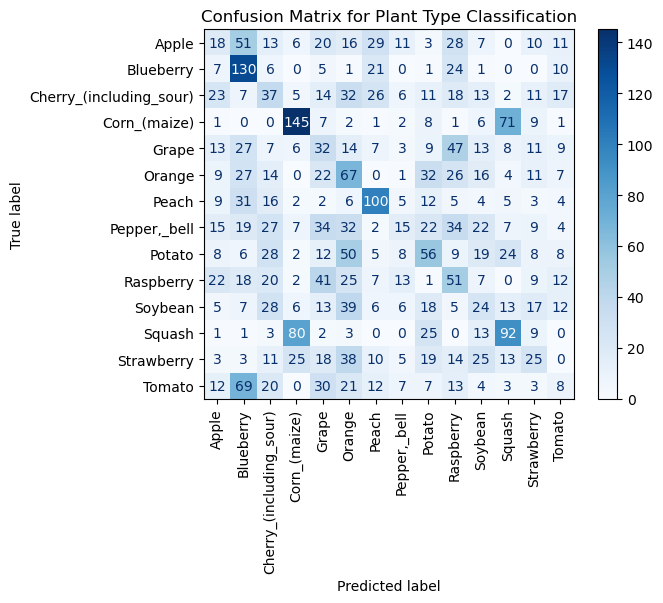

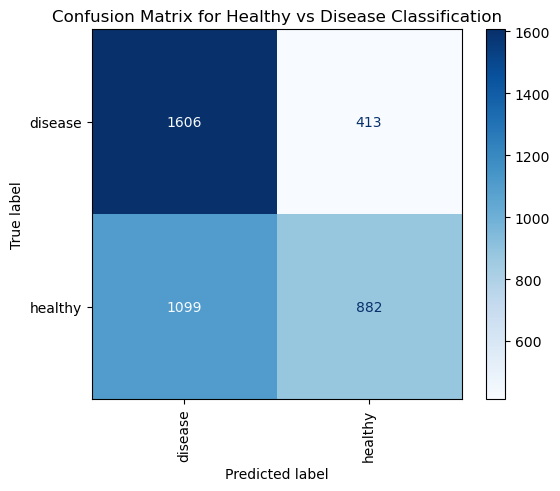

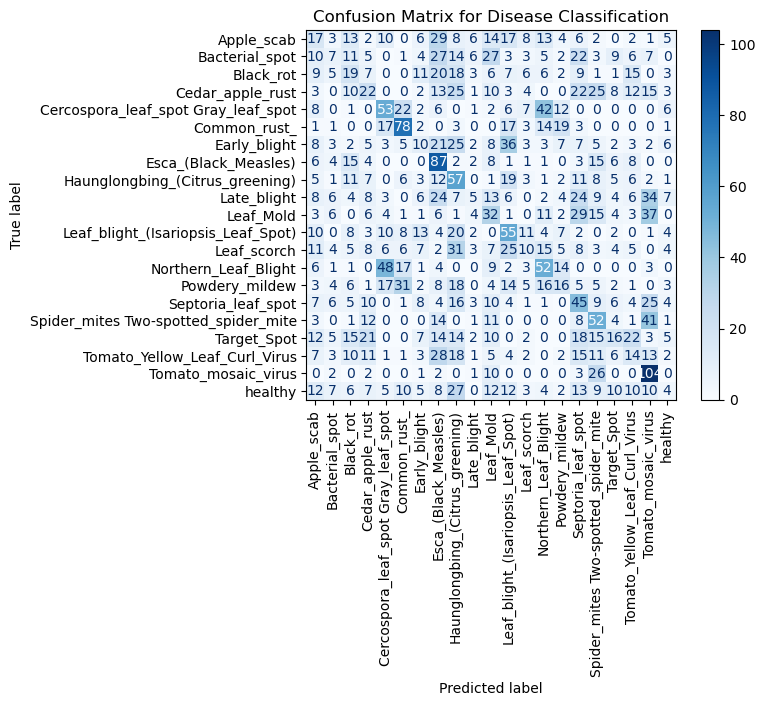

In [8]:
# Function to train SVM with controlled parallel backend
def train_svm_with_progress(X_train, y_train, desc):
    print(f"Training {desc} with data shape: {X_train.shape}, labels shape: {y_train.shape}")
    svm = SVC(kernel='linear', random_state=42)
    start_time = time.time()
    
    # Use a controlled parallel backend
    with joblib.parallel_backend('threading', n_jobs=-1):
        svm.fit(X_train, y_train)
    
    end_time = time.time()
    print(f"Finished training {desc} in {end_time - start_time} seconds")
    return svm

# Function to perform GridSearchCV
def perform_grid_search(X_train, y_train):
    param_grid = {
        'C': [0.1, 1],
        'gamma': [1, 0.1, 0.01],
        'kernel': ['linear', 'rbf', 'sigmoid'],
    }
    
    grid_search = GridSearchCV(SVC(), param_grid, refit=True, verbose=2, cv=3)
    
    with joblib.parallel_backend('threading', n_jobs=-1):
        print("Starting Grid Search...")
        grid_search.fit(X_train, y_train)
        print("Grid Search completed.")
    
    return grid_search.best_estimator_

# Train and evaluate SVM for each classification stage
svm_plant_type = perform_grid_search(X_train_plant_pca_70, y_train_plant)
y_pred_plant = svm_plant_type.predict(X_test_plant_pca_70)
print(f"Plant Type Model Accuracy: {accuracy_score(y_test_plant, y_pred_plant)}")
print(classification_report(y_test_plant, y_pred_plant, target_names=plant_label_encoder.classes_))

svm_health = perform_grid_search(X_train_health_pca_70, y_train_health)
y_pred_health = svm_health.predict(X_test_health_pca_70)
print(f"Healthy vs Disease Model Accuracy: {accuracy_score(y_test_health, y_pred_health)}")
print(classification_report(y_test_health, y_pred_health, target_names=health_label_encoder.classes_))

svm_disease = perform_grid_search(X_train_disease_pca_70, y_train_disease)
y_pred_disease = svm_disease.predict(X_test_disease_pca_70)
print(f"Disease Model Accuracy: {accuracy_score(y_test_disease, y_pred_disease)}")
print(classification_report(y_test_disease, y_pred_disease, target_names=disease_label_encoder.classes_))

# Visualization: Plot confusion matrices
def plot_confusion_matrix(y_true, y_pred, classes, title):
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
    disp.plot(cmap=plt.cm.Blues)
    plt.title(title)
    plt.xticks(rotation=90)
    plt.show()

# Plot confusion matrices
plot_confusion_matrix(y_test_plant, y_pred_plant, plant_label_encoder.classes_, 'Confusion Matrix for Plant Type Classification')
plot_confusion_matrix(y_test_health, y_pred_health, health_label_encoder.classes_, 'Confusion Matrix for Healthy vs Disease Classification')
plot_confusion_matrix(y_test_disease, y_pred_disease, disease_label_encoder.classes_, 'Confusion Matrix for Disease Classification')

## 4. Visualization

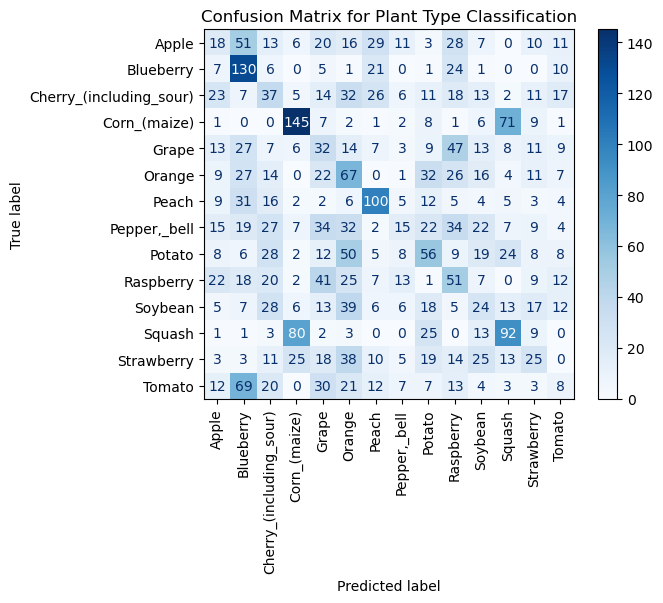

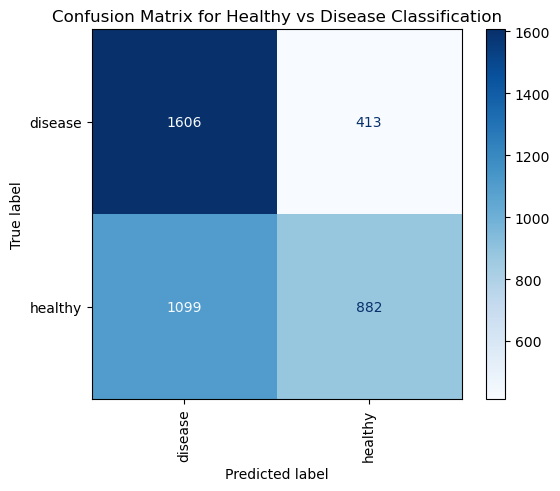

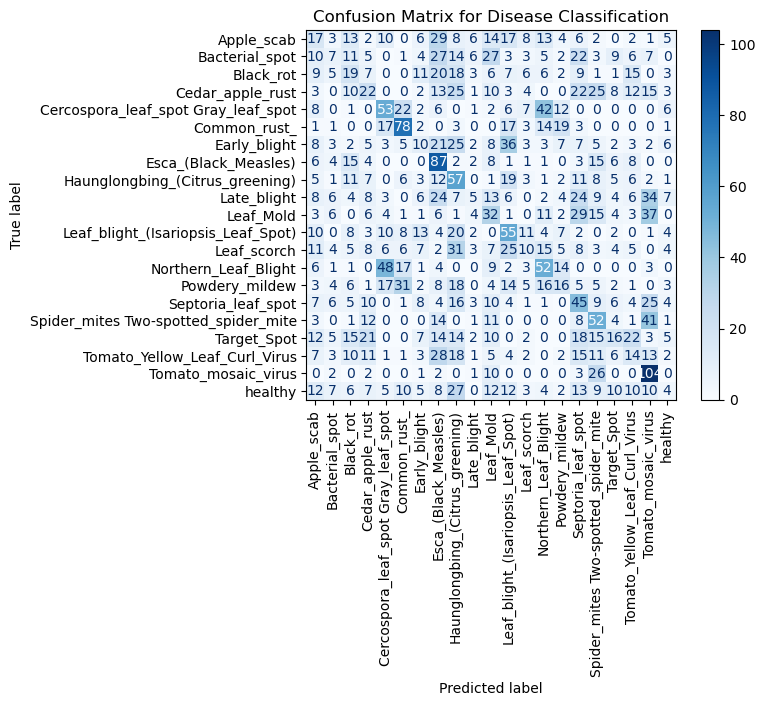

In [9]:
# Visualization: Plot confusion matrices
def plot_confusion_matrix(y_true, y_pred, classes, title):
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
    disp.plot(cmap=plt.cm.Blues)
    plt.title(title)
    plt.xticks(rotation=90)
    plt.show()

# Plot confusion matrices
plot_confusion_matrix(y_test_plant, y_pred_plant, plant_label_encoder.classes_, 'Confusion Matrix for Plant Type Classification')
plot_confusion_matrix(y_test_health, y_pred_health, health_label_encoder.classes_, 'Confusion Matrix for Healthy vs Disease Classification')
plot_confusion_matrix(y_test_disease, y_pred_disease, disease_label_encoder.classes_, 'Confusion Matrix for Disease Classification')

# HOG + PCA + Decision Tree

## Step 1: Load and Prepare Data from Original Path

In [2]:
# Paths
data_path = 'C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/augmented'
image_size = (64, 64)  # Resize to 48x48
n_components = 500  # Number of principal components

# Load images and labels into memory
def load_data(data_path, image_size):
    categories = os.listdir(data_path)
    images = []
    labels = []
    for category in categories:
        category_path = os.path.join(data_path, category)
        if os.path.isdir(category_path):
            img_names = os.listdir(category_path)
            for img_name in img_names:
                img_path = os.path.join(category_path, img_name)
                img = cv2.imread(img_path)  # Read image with color
                if img is not None:
                    img = cv2.resize(img, image_size)  # Resize to 48x48
                    images.append(img)
                    labels.append(category)
    return np.array(images), np.array(labels)

# Encode labels
def encode_labels(labels, all_labels):
    label_encoder = LabelEncoder()
    label_encoder.fit(all_labels)
    return label_encoder.transform(labels), label_encoder

# Load and preprocess data
images, labels = load_data(data_path, image_size)
all_labels = [category for category in os.listdir(data_path)]
labels, label_encoder = encode_labels(labels, all_labels)


In [3]:
# Apply RandomUnderSampler to balance the data
rus = RandomUnderSampler(random_state=42)
images_resampled, labels_resampled = rus.fit_resample(images.reshape(len(images), -1), labels)

# Reshape images back to original dimensions
images_resampled = images_resampled.reshape(-1, image_size[0], image_size[1], 3)

In [4]:
# HOG feature extraction
def extract_hog_features(image):
    features = hog(image, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=False, channel_axis=-1)
    return features

# Extract HOG features from all images in parallel
with joblib.parallel_backend('threading', n_jobs=-1):
    hog_features = Parallel(n_jobs=-1)(delayed(extract_hog_features)(image) for image in tqdm(images_resampled, desc="Extracting HOG Features"))

hog_features = np.array(hog_features)

Extracting HOG Features: 100%|██████████| 17328/17328 [00:26<00:00, 651.94it/s]


## Step 2: Reducing Dimension

Explained variance ratio: [0.05542867 0.04334355 0.03832369 0.03457595 0.03378714 0.02454949
 0.01480594 0.01461547 0.01341645 0.01206445 0.01188379 0.01134007
 0.01125219 0.0107585  0.01064257 0.01037618 0.00987708 0.00909404
 0.00864407 0.00858366 0.00824403 0.00812607 0.00768063 0.00751534
 0.00698597 0.00652886 0.00646327 0.00630681 0.00606705 0.00547496
 0.00540882 0.00535056 0.00502664 0.00494169 0.00484604 0.00463532
 0.00459995 0.00448321 0.00416375 0.00407542 0.00390497 0.00388196
 0.00376461 0.00371111 0.00366916 0.00366447 0.00356263 0.0034537
 0.00341793 0.00331689 0.00322334 0.00318408 0.00308883 0.00307667
 0.00302821 0.00295328 0.00287154 0.00284385 0.00278037 0.00274063
 0.00269398 0.00267264 0.00261447 0.00259598 0.00255065 0.00254412
 0.00252254 0.00245213 0.0024344  0.00241544 0.00240388 0.00235856
 0.0023313  0.00227605 0.00224103 0.0021968  0.00219084 0.00213164
 0.00211541 0.00207922 0.00205761 0.00204515 0.00202454 0.00200436
 0.00199686 0.00199599 0.00195584 0.0

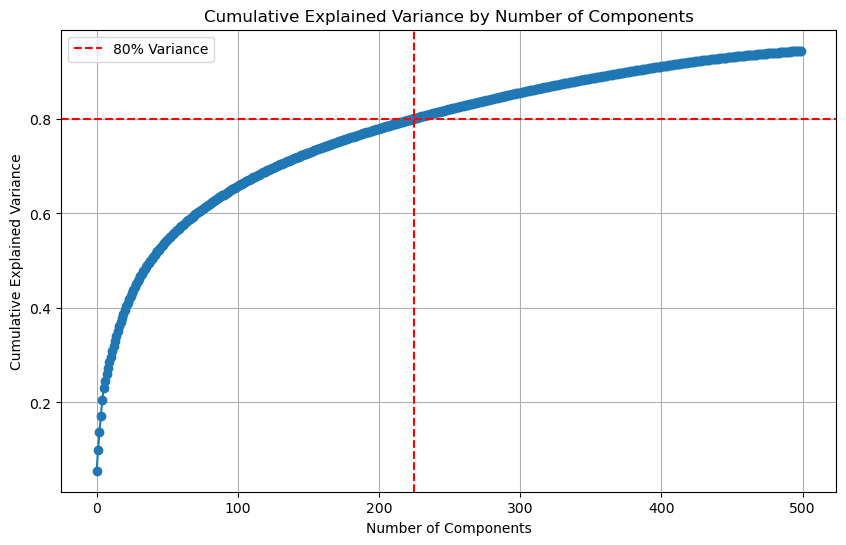

Number of components explaining 80% variance: 225
X_train_pca_80 shape: (13862, 225)
X_test_pca_80 shape: (3466, 225)


In [5]:
# Split data into training and testing sets before PCA
X_train, X_test, y_train, y_test = train_test_split(hog_features, labels_resampled, test_size=0.2, random_state=42)

# Standardize the training and testing sets separately
scaler_hog = StandardScaler()
X_train_scaled = scaler_hog.fit_transform(X_train)
X_test_scaled = scaler_hog.transform(X_test)

# Apply PCA to the training set and transform the test set
pca = PCA(n_components=n_components)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Calculate cumulative explained variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
print(f"Explained variance ratio: {pca.explained_variance_ratio_}")
print(f"Cumulative explained variance: {cumulative_variance}")

n_components_80 = np.argmax(cumulative_variance >= 0.80) + 1

# Plot the cumulative explained variance
plt.figure(figsize=(10, 6))
plt.plot(cumulative_variance, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance by Number of Components')
plt.axhline(y=0.80, color='r', linestyle='--', label='80% Variance')
plt.axvline(x=n_components_80, color='r', linestyle='--')
plt.legend()
plt.grid()
plt.show()

print(f"Number of components explaining 80% variance: {n_components_80}")

# Transform the data using the selected number of components
X_train_pca_80 = X_train_pca[:, :n_components_80]
X_test_pca_80 = X_test_pca[:, :n_components_80]

print(f"X_train_pca_80 shape: {X_train_pca_80.shape}")
print(f"X_test_pca_80 shape: {X_test_pca_80.shape}")

## Step 3: Hyperparameter Tuning with GridSearchCV

In [8]:
# Define the parameter grid for Decision Tree
param_grid = {
    'max_depth': [5, 10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4, 8, 16, 32, 64, 128],
    'max_features': ['auto', 'sqrt', 'log2']
}

# Initialize the GridSearchCV with DecisionTreeClassifier and the parameter grid
grid_search = GridSearchCV(DecisionTreeClassifier(random_state=42), param_grid, refit=True, verbose=2, cv=3, n_jobs=-1)

# Use a controlled parallel backend
with joblib.parallel_backend('threading', n_jobs=-1):
    print("Starting Grid Search...")
    grid_search.fit(X_train_pca_80, y_train)
    print("Grid Search completed.")

# Get the best estimator
best_tree = grid_search.best_estimator_

# Train the best estimator
best_tree.fit(X_train_pca_80, y_train)

# Predict and evaluate the model
y_pred_tree = best_tree.predict(X_test_pca_80)
print(f"Optimized Decision Tree Model Accuracy: {accuracy_score(y_test, y_pred_tree)}")

Starting Grid Search...
Fitting 3 folds for each of 288 candidates, totalling 864 fits
[CV] END max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.1s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=5; total time=   0.1s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.1s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=5; total time=   0.1s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=10; total time=   0.1s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.2s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2; total time=   0.2s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=5; total time=   0.2s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=10; total time=   0.1s
[

Unique classes in training set: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37]
Unique classes in test set: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37]
Correct labels: ['Apple___Apple_scab' 'Apple___Black_rot' 'Apple___Cedar_apple_rust'
 'Apple___healthy' 'Blueberry___healthy'
 'Cherry_(including_sour)___Powdery_mildew'
 'Cherry_(including_sour)___healthy'
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot'
 'Corn_(maize)___Common_rust_' 'Corn_(maize)___Northern_Leaf_Blight'
 'Corn_(maize)___healthy' 'Grape___Black_rot'
 'Grape___Esca_(Black_Measles)'
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)' 'Grape___healthy'
 'Orange___Haunglongbing_(Citrus_greening)' 'Peach___Bacterial_spot'
 'Peach___healthy' 'Pepper,_bell___Bacterial_spot'
 'Pepper,_bell___healthy' 'Potato___Early_blight' 'Potato___Late_blight'
 'Potato___healthy' 'Raspberry___healthy'

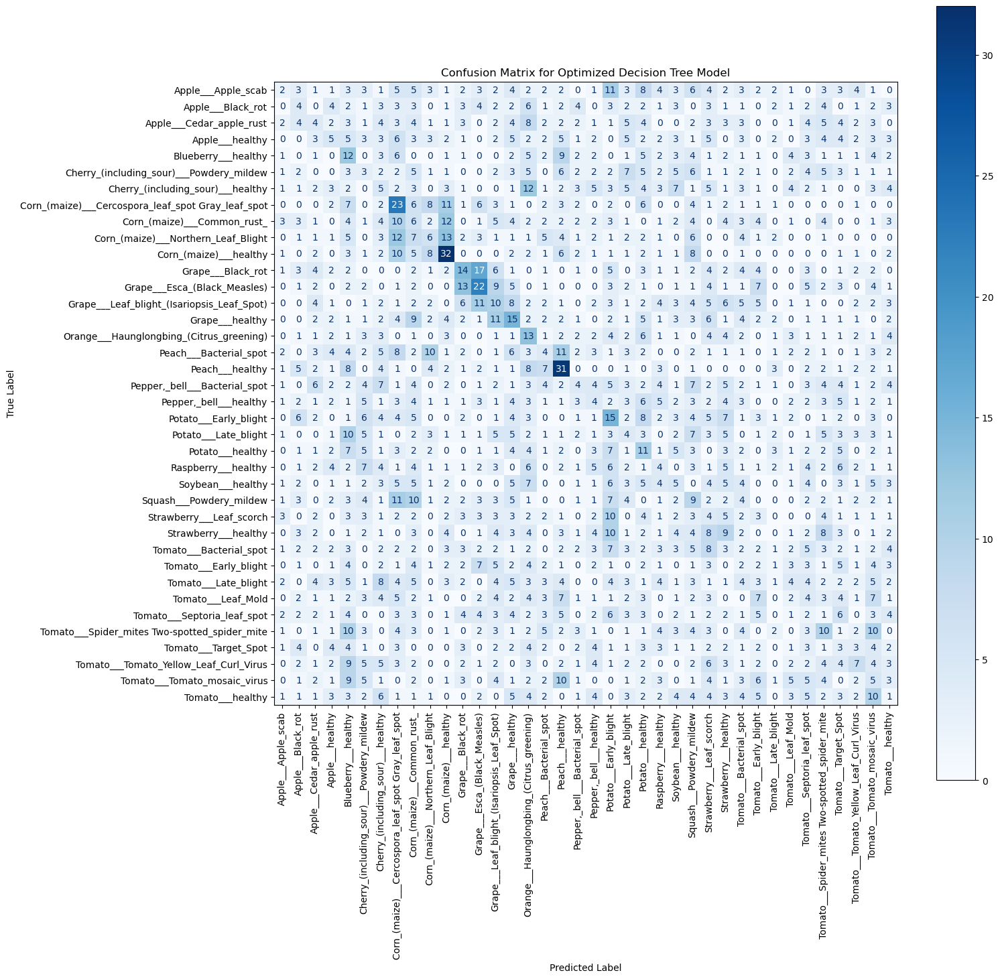

In [9]:
# Check unique classes in training and test sets
unique_classes_train = np.unique(y_train)
unique_classes_test = np.unique(y_test)
print(f"Unique classes in training set: {unique_classes_train}")
print(f"Unique classes in test set: {unique_classes_test}")

# Adjust the classification report to handle the mismatch in classes
correct_labels = label_encoder.inverse_transform(unique_classes_test)
print(f"Correct labels: {correct_labels}")

# Use correct_labels in the classification report
print(classification_report(y_test, y_pred_tree, labels=unique_classes_test, target_names=correct_labels))

# Confusion Matrix for Decision Tree Model
conf_matrix_tree = confusion_matrix(y_test, y_pred_tree, labels=unique_classes_test)

fig, ax = plt.subplots(figsize=(15, 15))  # Increase the size of the figure
disp_tree = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_tree, display_labels=correct_labels)
disp_tree.plot(cmap=plt.cm.Blues, ax=ax, xticks_rotation='vertical')
plt.title('Confusion Matrix for Optimized Decision Tree Model')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks(rotation=90)
plt.show()

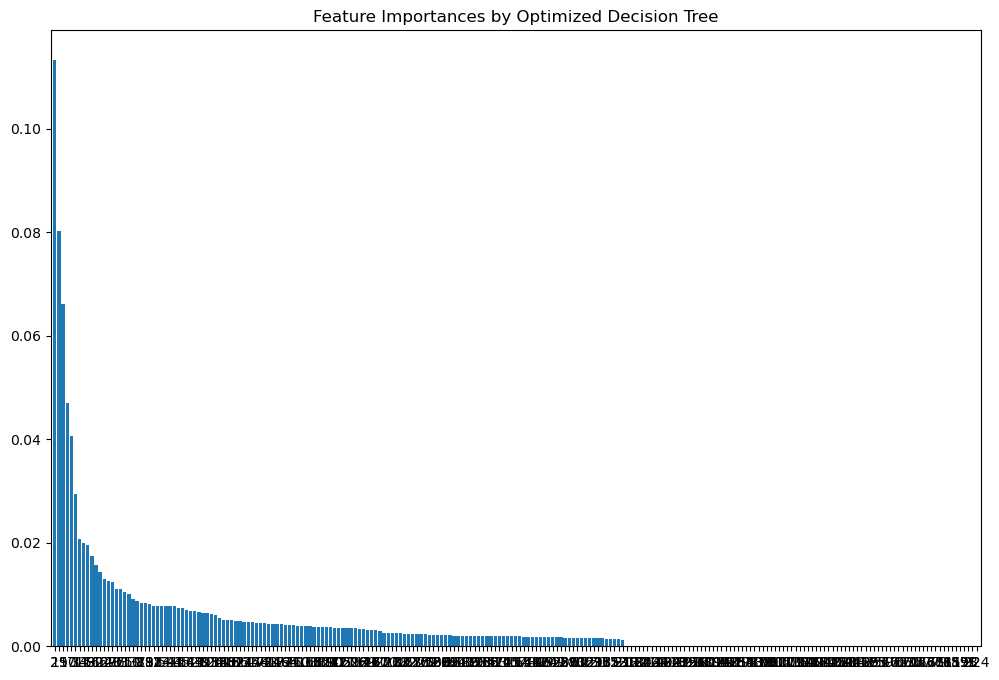

                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.06      0.02      0.03       106
                                 Apple___Black_rot       0.07      0.05      0.06        76
                          Apple___Cedar_apple_rust       0.06      0.04      0.05        93
                                   Apple___healthy       0.08      0.05      0.06        95
                               Blueberry___healthy       0.08      0.14      0.10        83
          Cherry_(including_sour)___Powdery_mildew       0.04      0.03      0.03        89
                 Cherry_(including_sour)___healthy       0.05      0.05      0.05        94
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.15      0.24      0.18        96
                       Corn_(maize)___Common_rust_       0.05      0.06      0.05        97
               Corn_(maize)___Northern_Leaf_Blight       0.10      0.07      0.

In [10]:
# Plot feature importances
importances = best_tree.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(12, 8))
plt.title("Feature Importances by Optimized Decision Tree")
plt.bar(range(X_train_pca_80.shape[1]), importances[indices], align="center")
plt.xticks(range(X_train_pca_80.shape[1]), indices[:X_train_pca_80.shape[1]])
plt.xlim([-1, X_train_pca_80.shape[1]])
plt.show()

# Use correct_labels in the classification report
print(classification_report(y_test, y_pred_tree, labels=unique_classes_test, target_names=correct_labels))

# HOG + PCA + Decision Tree Segregated

## 1. Loading Data

In [6]:
# Paths
data_path = 'C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/augmented'
image_size = (64, 64)  # Resize to 64x64
n_components = 300  # Number of principal components

# Load images and labels into memory
def load_data(data_path, image_size):
    categories = os.listdir(data_path)
    images = []
    labels = []
    for category in categories:
        category_path = os.path.join(data_path, category)
        if os.path.isdir(category_path):
            img_names = os.listdir(category_path)
            for img_name in img_names:
                img_path = os.path.join(category_path, img_name)
                img = cv2.imread(img_path)  # Read image with color
                if img is not None:
                    img = cv2.resize(img, image_size)  # Resize to 64x64
                    images.append(img)
                    labels.append(category)
    return np.array(images), np.array(labels)

# Load and preprocess data
images, labels = load_data(data_path, image_size)

In [7]:
# Function to limit the sample size without exceeding the original class count
def limit_samples(X, y, max_samples=20000):
    class_counts = np.bincount(y)
    max_class_samples = min(max_samples // len(np.unique(y)), min(class_counts))
    sampling_strategy = {i: min(max_class_samples, count) for i, count in enumerate(class_counts)}
    rus = RandomUnderSampler(sampling_strategy=sampling_strategy, random_state=42)
    X_resampled, y_resampled = rus.fit_resample(X, y)
    return X_resampled, y_resampled

# Stage 1: Plant Type Classification
plant_labels = [label.split('___')[0] for label in labels]
plant_label_encoder = LabelEncoder()
plant_labels_encoded = plant_label_encoder.fit_transform(plant_labels)
images_resampled_plant, plant_labels_resampled = limit_samples(images.reshape(len(images), -1), plant_labels_encoded)
images_resampled_plant = images_resampled_plant.reshape(-1, image_size[0], image_size[1], 3)

# Stage 2: Healthy vs Disease Classification
health_labels = ['healthy' if 'healthy' in label else 'disease' for label in labels]
health_label_encoder = LabelEncoder()
health_labels_encoded = health_label_encoder.fit_transform(health_labels)
images_resampled_health, health_labels_resampled = limit_samples(images.reshape(len(images), -1), health_labels_encoded)
images_resampled_health = images_resampled_health.reshape(-1, image_size[0], image_size[1], 3)

# Stage 3: Disease Classification (excluding healthy samples)
disease_labels = [label.split('___')[1] if '___' in label else 'healthy' for label in labels]
disease_label_encoder = LabelEncoder()
disease_labels_encoded = disease_label_encoder.fit_transform(disease_labels)
images_resampled_disease, disease_labels_resampled = limit_samples(images.reshape(len(images), -1), disease_labels_encoded)
images_resampled_disease = images_resampled_disease.reshape(-1, image_size[0], image_size[1], 3)

print(f"Resampled images for plant type classification: {images_resampled_plant.shape}")
print(f"Resampled images for healthy vs disease classification: {images_resampled_health.shape}")
print(f"Resampled images for disease classification: {images_resampled_disease.shape}")

Resampled images for plant type classification: (15582, 64, 64, 3)
Resampled images for healthy vs disease classification: (20000, 64, 64, 3)
Resampled images for disease classification: (17325, 64, 64, 3)


## 2. HOG + PCA

Extracting HOG Features: 100%|██████████| 17325/17325 [00:26<00:00, 644.18it/s]


Plant explained variance ratio: [0.05730127 0.04718722 0.03654763 0.03550326 0.03467351 0.02487779
 0.01464332 0.01447816 0.0136413  0.01274404 0.01239565 0.01194284
 0.01187592 0.01105775 0.01074873 0.01058929 0.01022303 0.00928163
 0.00896173 0.00857202 0.0083016  0.00827915 0.00774329 0.00771675
 0.00698476 0.00659839 0.00635246 0.00631189 0.00627522 0.00559648
 0.00536924 0.00533377 0.0052645  0.00495878 0.00464539 0.00461021
 0.00447684 0.00432397 0.00416796 0.00406392 0.00395041 0.00382652
 0.00379235 0.00366172 0.00358926 0.00355351 0.00348391 0.00343081
 0.0034257  0.00336907 0.00334278 0.00320534 0.00315898 0.0030377
 0.00297404 0.00291914 0.00289234 0.00285628 0.00280733 0.00274842
 0.00270775 0.0026555  0.00260762 0.00257838 0.00255185 0.00253339
 0.00246089 0.00244977 0.00243046 0.00236806 0.00233439 0.00229804
 0.00226928 0.00225237 0.00219236 0.00214252 0.00211461 0.00210868
 0.00207558 0.00205804 0.0020093  0.00199361 0.00198376 0.00196298
 0.00195363 0.00193804 0.001914

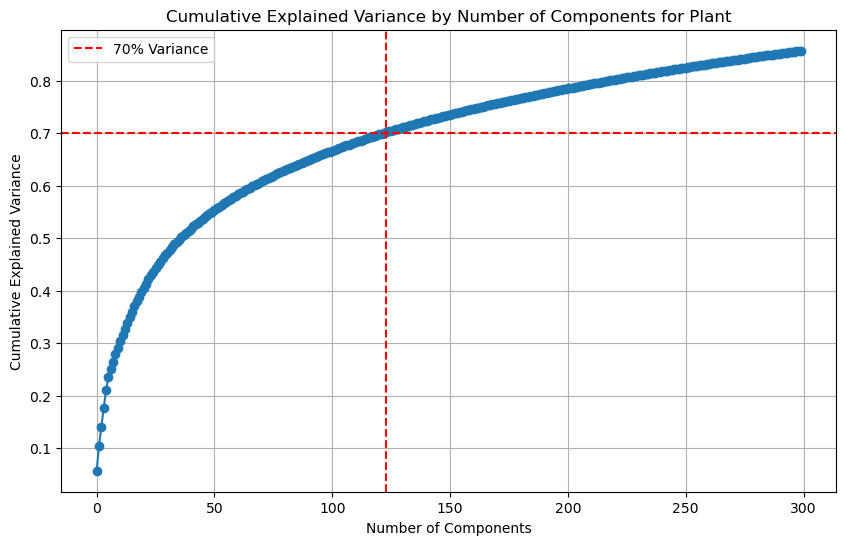

Number of components explaining 70% variance for Plant: 123
Health explained variance ratio: [0.0541217  0.04578583 0.03657025 0.03552624 0.0347311  0.02341911
 0.01458257 0.01427647 0.01354346 0.01311195 0.01266638 0.01217489
 0.0116319  0.01105519 0.01065398 0.01053657 0.01011328 0.00939746
 0.00886304 0.00860325 0.00835093 0.00806458 0.00743794 0.00738734
 0.00728821 0.00672063 0.00654293 0.00641866 0.00599557 0.00566391
 0.00553885 0.00538818 0.00535485 0.00512468 0.00481695 0.00447651
 0.00436122 0.0043301  0.00421224 0.00410992 0.00398718 0.00393362
 0.00386056 0.00378185 0.00376145 0.00370083 0.00355101 0.00349715
 0.00344312 0.00341648 0.00335746 0.00327352 0.00316141 0.00307955
 0.00304885 0.00299089 0.00296263 0.00292427 0.00280261 0.00275076
 0.00273572 0.00271287 0.00270367 0.00266915 0.00265217 0.00253239
 0.00252829 0.00252003 0.00245527 0.00244521 0.00241362 0.00238215
 0.00232556 0.00230199 0.00225234 0.0022333  0.00214061 0.00212044
 0.0020774  0.00207147 0.00206646 0.

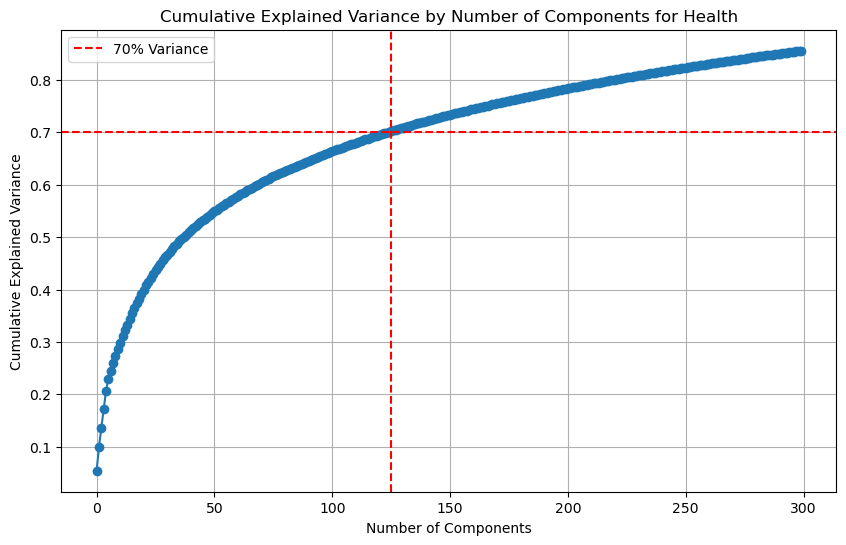

Number of components explaining 70% variance for Health: 125
Disease explained variance ratio: [0.0555174  0.04392324 0.04107841 0.03417245 0.03248008 0.02236622
 0.01552526 0.01506649 0.01328986 0.01197172 0.0118074  0.01126292
 0.01053865 0.01032713 0.01009944 0.00979464 0.00955954 0.00913233
 0.00891933 0.00846753 0.00820795 0.00798652 0.00759771 0.00745572
 0.0068956  0.00633822 0.00621856 0.00609491 0.00602716 0.00532963
 0.00520967 0.00514473 0.00494925 0.00488977 0.00479378 0.00459659
 0.00445295 0.00433972 0.004122   0.00408292 0.00400481 0.00389799
 0.0037137  0.00369507 0.00360963 0.00352919 0.00345376 0.00341071
 0.00337453 0.00335221 0.00316929 0.0031427  0.00314057 0.00301885
 0.00298061 0.00296211 0.00290884 0.00284294 0.00277591 0.00276922
 0.00267569 0.00265086 0.00261712 0.00259232 0.00258592 0.00254208
 0.00250981 0.0024747  0.00245226 0.00240757 0.00240015 0.00233274
 0.00229513 0.00229007 0.00225667 0.00220605 0.00217058 0.00214277
 0.00212112 0.00208256 0.00207457 

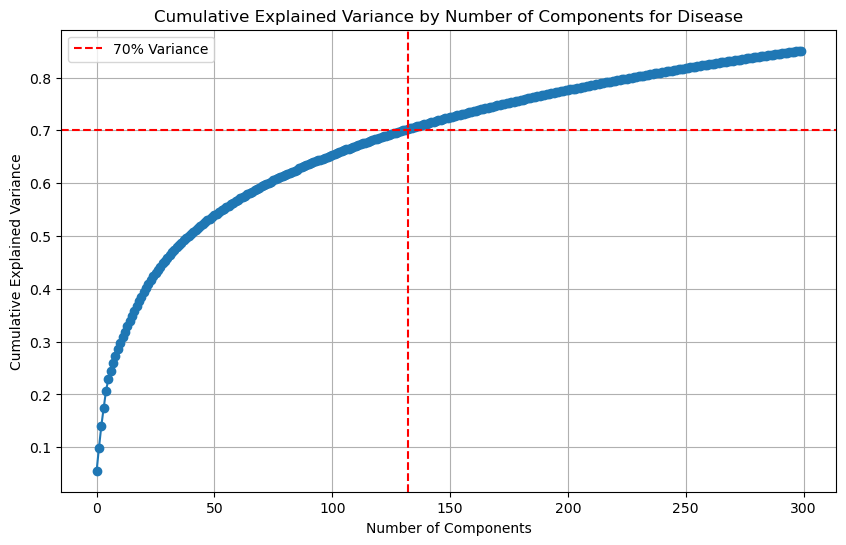

Number of components explaining 70% variance for Disease: 132
X_train_pca_plant_70 shape: (12465, 123)
X_test_pca_plant_70 shape: (3117, 123)
X_train_pca_health_70 shape: (16000, 125)
X_test_pca_health_70 shape: (4000, 125)
X_train_pca_disease_70 shape: (13860, 132)
X_test_pca_disease_70 shape: (3465, 132)


In [8]:
# HOG feature extraction
def extract_hog_features(image):
    features = hog(image, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=False, channel_axis=-1)
    return features

# Extract HOG features from all images in parallel
def extract_and_process_hog(images_resampled):
    with joblib.parallel_backend('threading', n_jobs=-1):
        hog_features = Parallel(n_jobs=-1)(delayed(extract_hog_features)(image) for image in tqdm(images_resampled, desc="Extracting HOG Features"))
    hog_features = np.array(hog_features)
    return hog_features

# Extract HOG features
hog_features_plant = extract_and_process_hog(images_resampled_plant)
hog_features_health = extract_and_process_hog(images_resampled_health)
hog_features_disease = extract_and_process_hog(images_resampled_disease)

# Split data into training and testing sets
X_train_plant, X_test_plant, y_train_plant, y_test_plant = train_test_split(hog_features_plant, plant_labels_resampled, test_size=0.2, random_state=42)
X_train_health, X_test_health, y_train_health, y_test_health = train_test_split(hog_features_health, health_labels_resampled, test_size=0.2, random_state=42)
X_train_disease, X_test_disease, y_train_disease, y_test_disease = train_test_split(hog_features_disease, disease_labels_resampled, test_size=0.2, random_state=42)

# Standardize the HOG features
scaler_hog_plant = StandardScaler()
X_train_plant_scaled = scaler_hog_plant.fit_transform(X_train_plant)
X_test_plant_scaled = scaler_hog_plant.transform(X_test_plant)

scaler_hog_health = StandardScaler()
X_train_health_scaled = scaler_hog_health.fit_transform(X_train_health)
X_test_health_scaled = scaler_hog_health.transform(X_test_health)

scaler_hog_disease = StandardScaler()
X_train_disease_scaled = scaler_hog_disease.fit_transform(X_train_disease)
X_test_disease_scaled = scaler_hog_disease.transform(X_test_disease)

# Apply PCA to the standardized HOG features
pca_plant = PCA(n_components=n_components)
X_train_pca_plant = pca_plant.fit_transform(X_train_plant_scaled)
X_test_pca_plant = pca_plant.transform(X_test_plant_scaled)

pca_health = PCA(n_components=n_components)
X_train_pca_health = pca_health.fit_transform(X_train_health_scaled)
X_test_pca_health = pca_health.transform(X_test_health_scaled)

pca_disease = PCA(n_components=n_components)
X_train_pca_disease = pca_disease.fit_transform(X_train_disease_scaled)
X_test_pca_disease = pca_disease.transform(X_test_disease_scaled)

# Calculate cumulative explained variance for each PCA
def calculate_and_plot_variance(pca, title):
    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    print(f"{title} explained variance ratio: {pca.explained_variance_ratio_}")
    print(f"{title} cumulative explained variance: {cumulative_variance}")

    n_components_70 = np.argmax(cumulative_variance >= 0.70) + 1

    plt.figure(figsize=(10, 6))
    plt.plot(cumulative_variance, marker='o')
    plt.xlabel('Number of Components')
    plt.ylabel('Cumulative Explained Variance')
    plt.title(f'Cumulative Explained Variance by Number of Components for {title}')
    plt.axhline(y=0.70, color='r', linestyle='--', label='70% Variance')
    plt.axvline(x=n_components_70, color='r', linestyle='--')
    plt.legend()
    plt.grid()
    plt.show()

    print(f"Number of components explaining 70% variance for {title}: {n_components_70}")
    return n_components_70

n_components_70_plant = calculate_and_plot_variance(pca_plant, "Plant")
n_components_70_health = calculate_and_plot_variance(pca_health, "Health")
n_components_70_disease = calculate_and_plot_variance(pca_disease, "Disease")

# Transform the data using the selected number of components for 70% variance
X_train_pca_plant_70 = X_train_pca_plant[:, :n_components_70_plant]
X_test_pca_plant_70 = X_test_pca_plant[:, :n_components_70_plant]

X_train_pca_health_70 = X_train_pca_health[:, :n_components_70_health]
X_test_pca_health_70 = X_test_pca_health[:, :n_components_70_health]

X_train_pca_disease_70 = X_train_pca_disease[:, :n_components_70_disease]
X_test_pca_disease_70 = X_test_pca_disease[:, :n_components_70_disease]

print(f"X_train_pca_plant_70 shape: {X_train_pca_plant_70.shape}")
print(f"X_test_pca_plant_70 shape: {X_test_pca_plant_70.shape}")
print(f"X_train_pca_health_70 shape: {X_train_pca_health_70.shape}")
print(f"X_test_pca_health_70 shape: {X_test_pca_health_70.shape}")
print(f"X_train_pca_disease_70 shape: {X_train_pca_disease_70.shape}")
print(f"X_test_pca_disease_70 shape: {X_test_pca_disease_70.shape}")


## 3. Training Decision Tree

In [9]:
# Function to train Decision Tree with controlled parallel backend
def train_tree_with_progress(X_train, y_train, desc):
    print(f"Training {desc} with data shape: {X_train.shape}, labels shape: {y_train.shape}")
    tree = DecisionTreeClassifier(random_state=42)
    start_time = time.time()
    
    # Use a controlled parallel backend
    with joblib.parallel_backend('threading', n_jobs=-1):
        tree.fit(X_train, y_train)
    
    end_time = time.time()
    print(f"Finished training {desc} in {end_time - start_time} seconds")
    return tree

# Train and evaluate Decision Tree for each classification stage
tree_plant_type = train_tree_with_progress(X_train_pca_plant_70, y_train_plant, "Plant Type Decision Tree")
y_pred_plant = tree_plant_type.predict(X_test_pca_plant_70)
print(f"Plant Type Model Accuracy: {accuracy_score(y_test_plant, y_pred_plant)}")
print(classification_report(y_test_plant, y_pred_plant, target_names=plant_label_encoder.classes_))

tree_health = train_tree_with_progress(X_train_pca_health_70, y_train_health, "Health Decision Tree")
y_pred_health = tree_health.predict(X_test_pca_health_70)
print(f"Healthy vs Disease Model Accuracy: {accuracy_score(y_test_health, y_pred_health)}")
print(classification_report(y_test_health, y_pred_health, target_names=health_label_encoder.classes_))

tree_disease = train_tree_with_progress(X_train_pca_disease_70, y_train_disease, "Disease Decision Tree")
y_pred_disease = tree_disease.predict(X_test_pca_disease_70)
print(f"Disease Model Accuracy: {accuracy_score(y_test_disease, y_pred_disease)}")
print(classification_report(y_test_disease, y_pred_disease, target_names=disease_label_encoder.classes_))

Training Plant Type Decision Tree with data shape: (12465, 123), labels shape: (12465,)
Finished training Plant Type Decision Tree in 1.8897817134857178 seconds
Plant Type Model Accuracy: 0.28103946102021177
                         precision    recall  f1-score   support

                  Apple       0.10      0.12      0.11       223
              Blueberry       0.35      0.37      0.36       206
Cherry_(including_sour)       0.13      0.14      0.13       222
           Corn_(maize)       0.71      0.60      0.65       254
                  Grape       0.41      0.43      0.42       206
                 Orange       0.50      0.40      0.44       236
                  Peach       0.45      0.47      0.46       204
           Pepper,_bell       0.17      0.15      0.16       249
                 Potato       0.18      0.16      0.17       243
              Raspberry       0.19      0.19      0.19       228
                Soybean       0.17      0.17      0.17       199
           

## 4. Visualization

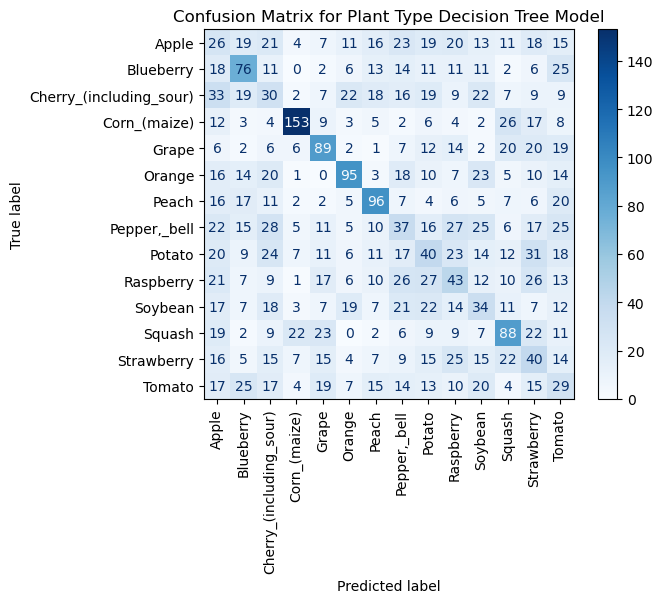

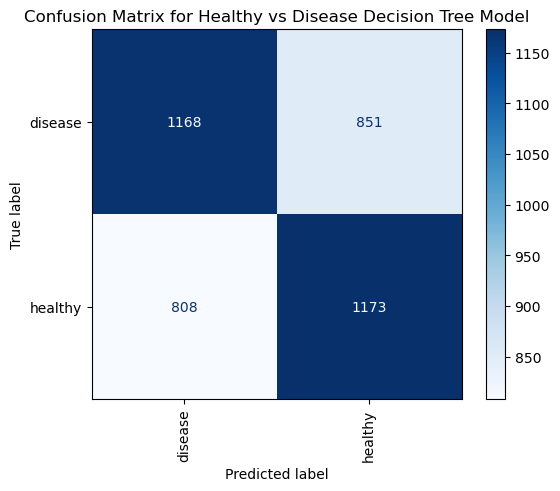

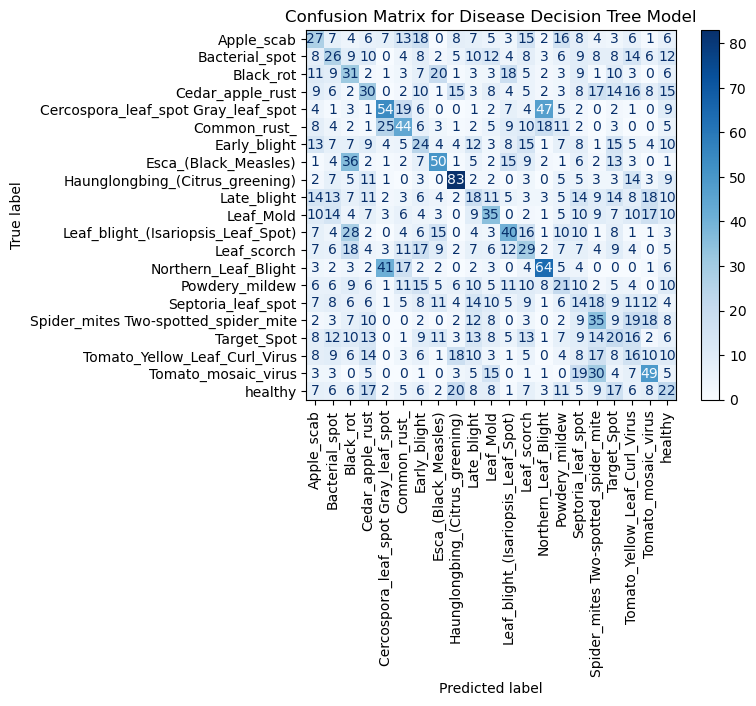

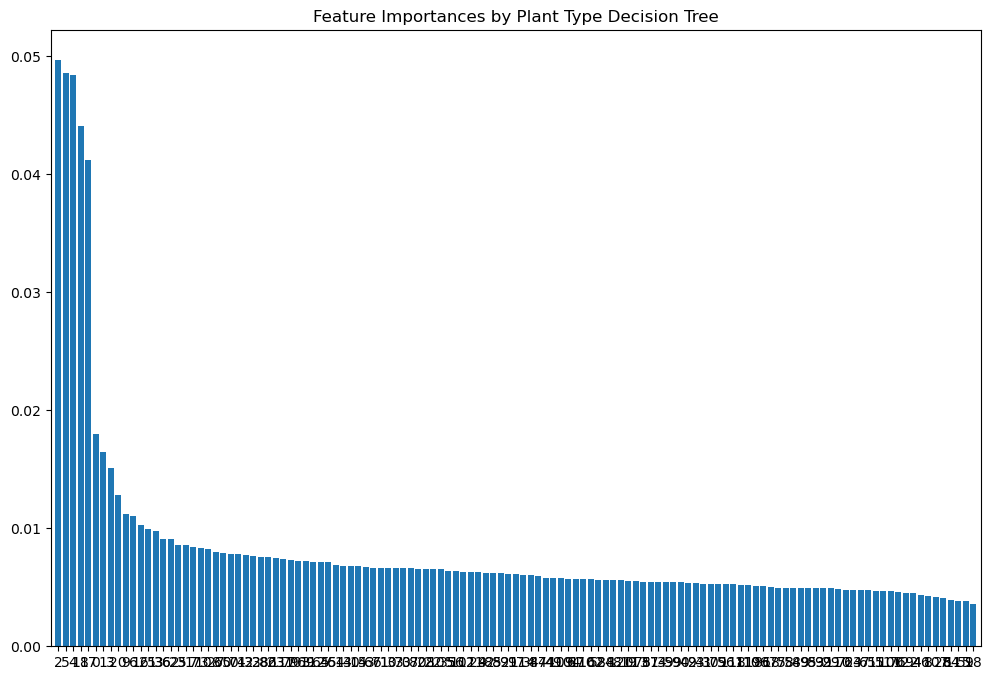

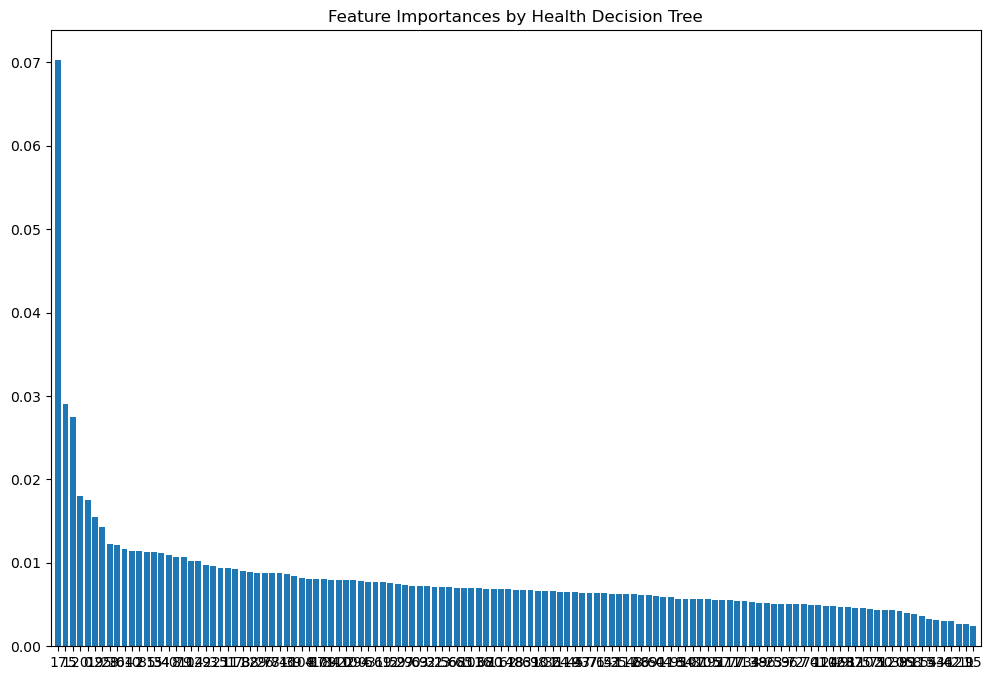

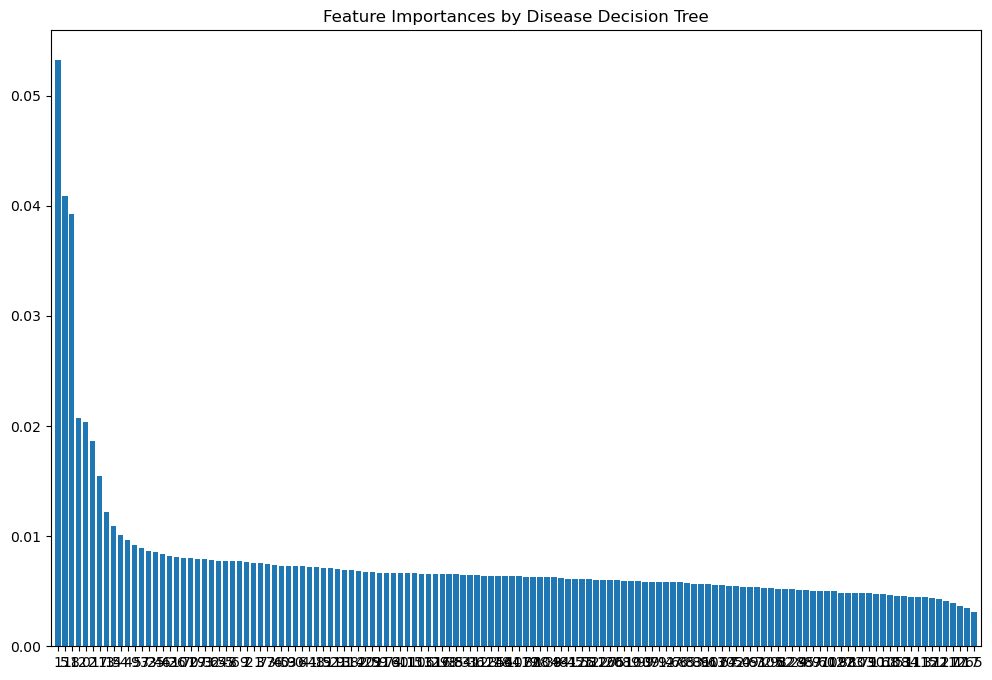

In [10]:
# Visualization: Plot confusion matrices
def plot_confusion_matrix(y_true, y_pred, classes, title):
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
    disp.plot(cmap=plt.cm.Blues)
    plt.title(title)
    plt.xticks(rotation=90)
    plt.show()

# Plot confusion matrix for each Decision Tree Model
plot_confusion_matrix(y_test_plant, y_pred_plant, plant_label_encoder.classes_, 'Confusion Matrix for Plant Type Decision Tree Model')
plot_confusion_matrix(y_test_health, y_pred_health, health_label_encoder.classes_, 'Confusion Matrix for Healthy vs Disease Decision Tree Model')
plot_confusion_matrix(y_test_disease, y_pred_disease, disease_label_encoder.classes_, 'Confusion Matrix for Disease Decision Tree Model')

# Plot feature importances
def plot_feature_importances(tree, X_train_pca_70, title):
    importances = tree.feature_importances_
    indices = np.argsort(importances)[::-1]

    plt.figure(figsize=(12, 8))
    plt.title(title)
    plt.bar(range(X_train_pca_70.shape[1]), importances[indices], align="center")
    plt.xticks(range(X_train_pca_70.shape[1]), indices[:X_train_pca_70.shape[1]])
    plt.xlim([-1, X_train_pca_70.shape[1]])
    plt.show()

plot_feature_importances(tree_plant_type, X_train_pca_plant_70, "Feature Importances by Plant Type Decision Tree")
plot_feature_importances(tree_health, X_train_pca_health_70, "Feature Importances by Health Decision Tree")
plot_feature_importances(tree_disease, X_train_pca_disease_70, "Feature Importances by Disease Decision Tree")


## 5. Optimization

Starting Grid Search for Plant Type...
Fitting 3 folds for each of 600 candidates, totalling 1800 fits
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=   2.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=   2.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=   2.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=   2.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=   2.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=   2.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=   2.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=   2.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf

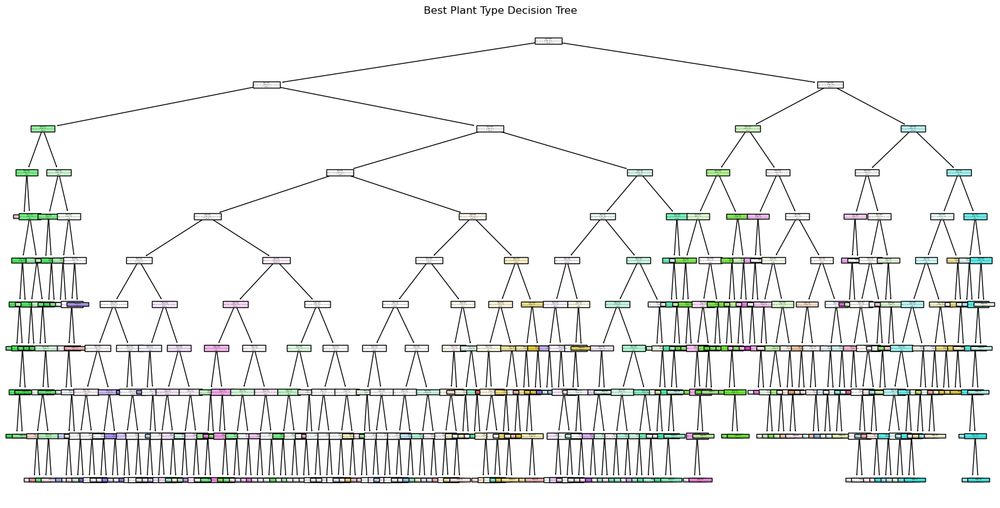

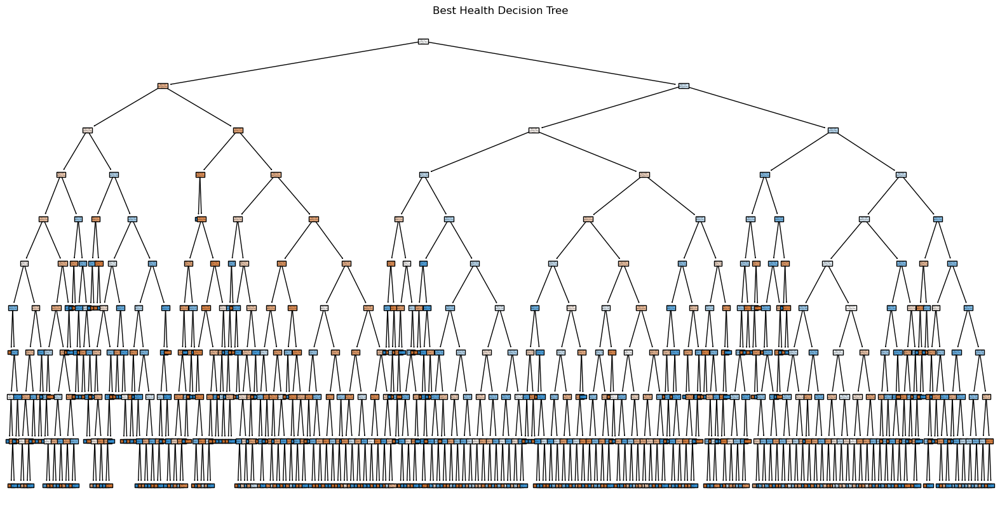

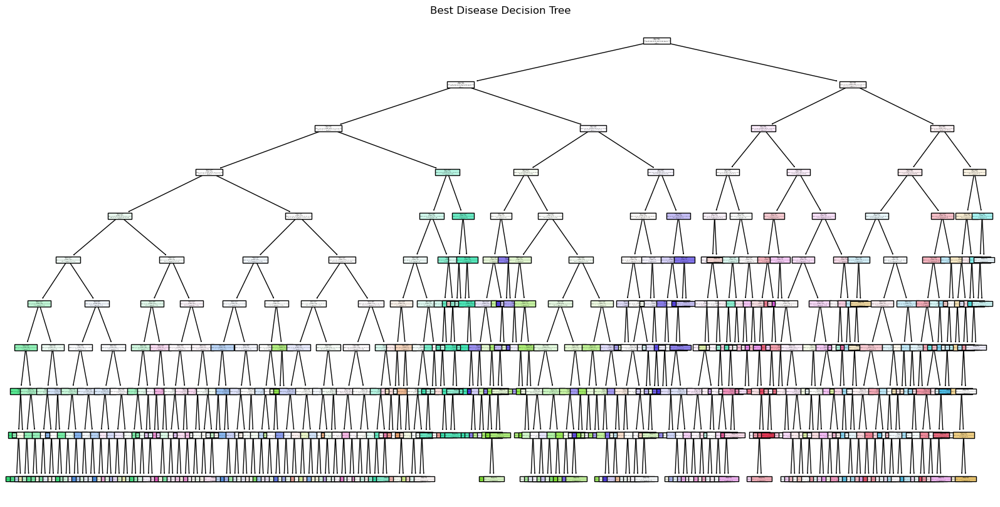

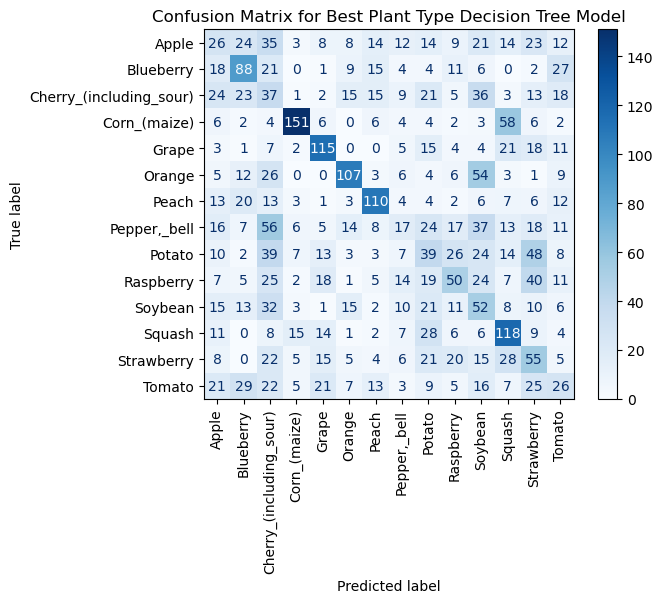

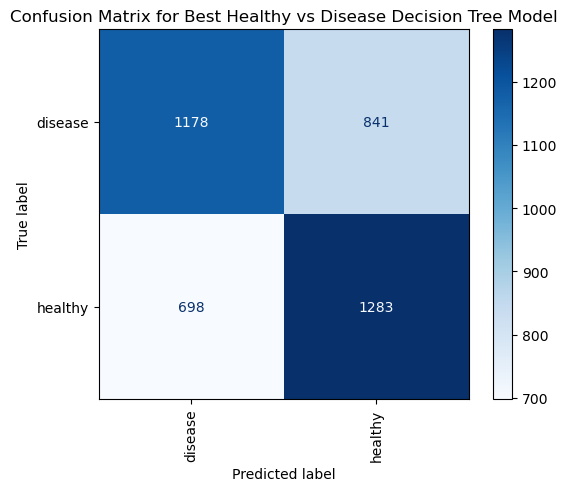

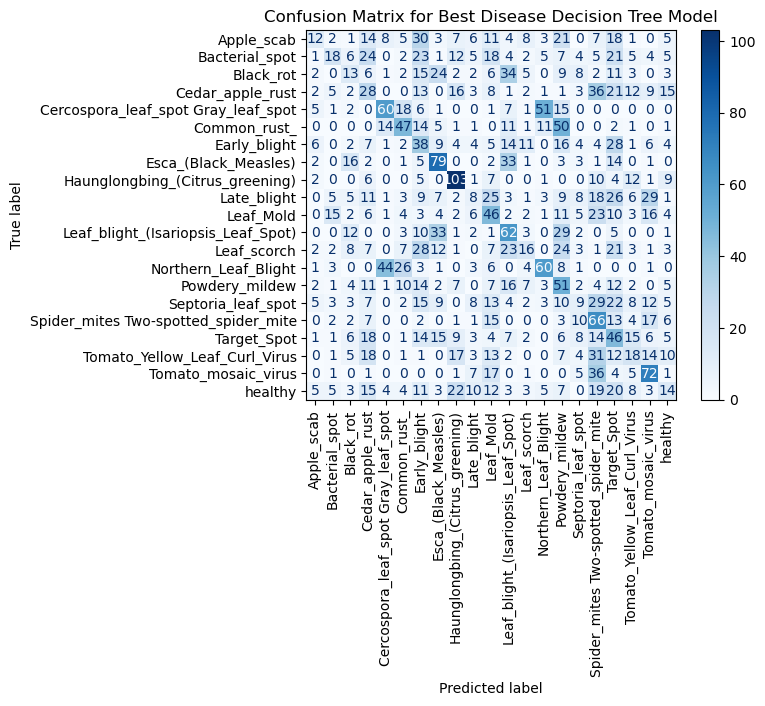

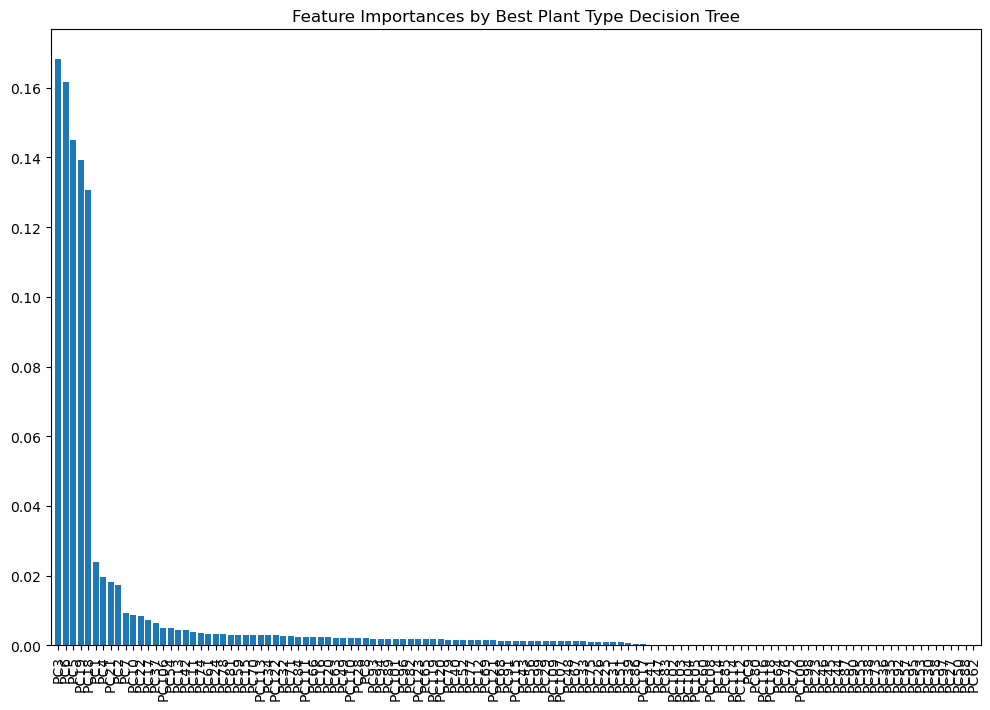

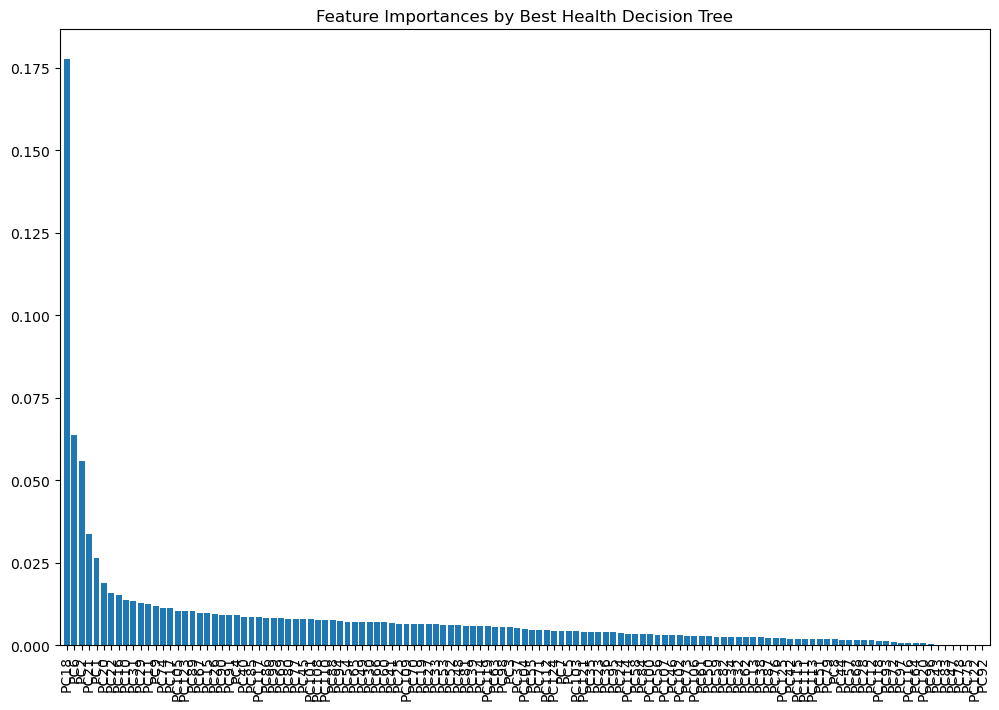

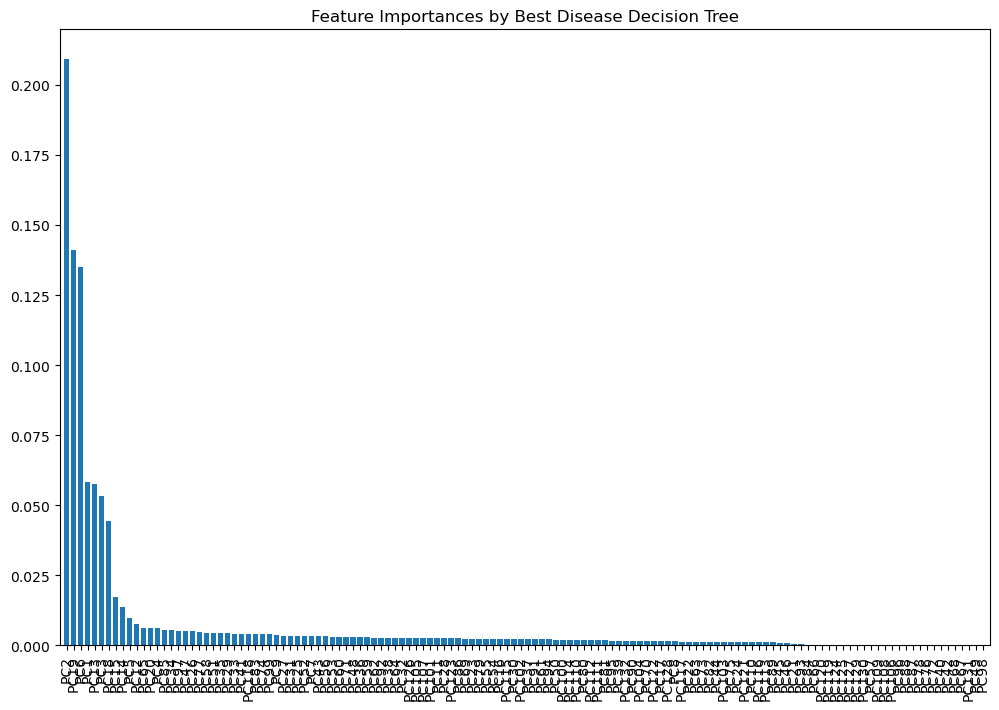

In [13]:
from sklearn.tree import plot_tree
from sklearn.model_selection import GridSearchCV

# Define the parameter grid for Decision Tree
param_grid = {
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10, 15, 20],
    'min_samples_leaf': [1, 2, 4, 8, 16],
    'max_features': [None, 'auto', 'sqrt', 'log2']
}

# Function to perform GridSearchCV and return the best estimator
def perform_grid_search(X_train, y_train, param_grid, desc):
    tree = DecisionTreeClassifier(random_state=42)
    grid_search = GridSearchCV(tree, param_grid, refit=True, verbose=2, cv=3, n_jobs=-1)
    
    with joblib.parallel_backend('threading', n_jobs=-1):
        print(f"Starting Grid Search for {desc}...")
        grid_search.fit(X_train, y_train)
        print(f"Grid Search completed for {desc}.")
    
    best_tree = grid_search.best_estimator_
    return best_tree, grid_search.best_params_

# Perform GridSearchCV for each classification stage
best_tree_plant, best_params_plant = perform_grid_search(X_train_pca_plant_70, y_train_plant, param_grid, "Plant Type")
best_tree_health, best_params_health = perform_grid_search(X_train_pca_health_70, y_train_health, param_grid, "Health")
best_tree_disease, best_params_disease = perform_grid_search(X_train_pca_disease_70, y_train_disease, param_grid, "Disease")

# Make predictions with the best models
y_pred_best_plant = best_tree_plant.predict(X_test_pca_plant_70)
y_pred_best_health = best_tree_health.predict(X_test_pca_health_70)
y_pred_best_disease = best_tree_disease.predict(X_test_pca_disease_70)

# Evaluate the best models
print(f"Best Plant Type Model Accuracy: {accuracy_score(y_test_plant, y_pred_best_plant)}")
print(classification_report(y_test_plant, y_pred_best_plant, target_names=plant_label_encoder.classes_))

print(f"Best Healthy vs Disease Model Accuracy: {accuracy_score(y_test_health, y_pred_best_health)}")
print(classification_report(y_test_health, y_pred_best_health, target_names=health_label_encoder.classes_))

print(f"Best Disease Model Accuracy: {accuracy_score(y_test_disease, y_pred_best_disease)}")
print(classification_report(y_test_disease, y_pred_best_disease, target_names=disease_label_encoder.classes_))

# Visualize the best Decision Trees
def visualize_tree(tree, feature_names, class_names, title):
    plt.figure(figsize=(20, 10))
    plot_tree(tree, filled=True, feature_names=feature_names, class_names=class_names)
    plt.title(title)
    plt.show()

# Use the number of components for each stage as the feature names
feature_names_plant = [f"PC{i}" for i in range(1, X_train_pca_plant_70.shape[1] + 1)]
feature_names_health = [f"PC{i}" for i in range(1, X_train_pca_health_70.shape[1] + 1)]
feature_names_disease = [f"PC{i}" for i in range(1, X_train_pca_disease_70.shape[1] + 1)]

class_names_plant = [str(cls) for cls in best_tree_plant.classes_]
class_names_health = [str(cls) for cls in best_tree_health.classes_]
class_names_disease = [str(cls) for cls in best_tree_disease.classes_]

visualize_tree(best_tree_plant, feature_names_plant, class_names_plant, "Best Plant Type Decision Tree")
visualize_tree(best_tree_health, feature_names_health, class_names_health, "Best Health Decision Tree")
visualize_tree(best_tree_disease, feature_names_disease, class_names_disease, "Best Disease Decision Tree")

# Plot confusion matrix for each best Decision Tree Model
plot_confusion_matrix(y_test_plant, y_pred_best_plant, plant_label_encoder.classes_, 'Confusion Matrix for Best Plant Type Decision Tree Model')
plot_confusion_matrix(y_test_health, y_pred_best_health, health_label_encoder.classes_, 'Confusion Matrix for Best Healthy vs Disease Decision Tree Model')
plot_confusion_matrix(y_test_disease, y_pred_best_disease, disease_label_encoder.classes_, 'Confusion Matrix for Best Disease Decision Tree Model')

# Plot feature importances for the best models
def plot_feature_importances(tree, feature_names, title):
    importances = tree.feature_importances_
    indices = np.argsort(importances)[::-1]

    plt.figure(figsize=(12, 8))
    plt.title(title)
    plt.bar(range(len(feature_names)), importances[indices], align="center")
    plt.xticks(range(len(feature_names)), np.array(feature_names)[indices], rotation=90)
    plt.xlim([-1, len(feature_names)])
    plt.show()

plot_feature_importances(best_tree_plant, feature_names_plant, "Feature Importances by Best Plant Type Decision Tree")
plot_feature_importances(best_tree_health, feature_names_health, "Feature Importances by Best Health Decision Tree")
plot_feature_importances(best_tree_disease, feature_names_disease, "Feature Importances by Best Disease Decision Tree")

# Random Forest

## Step 1: Load and Prepare Data

In [3]:
# Paths
data_path = 'C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/augmented'
image_size = (32, 32)  # Resize to 256x256
sample_fraction = 0.05  # Fraction of images to sample from each category

# Load images and labels
def load_data(data_path, image_size, sample_fraction=0.1):
    categories = os.listdir(data_path)
    images = []
    labels = []
    for category in tqdm(categories, desc="Loading Categories"):
        category_path = os.path.join(data_path, category)
        if os.path.isdir(category_path):
            img_names = os.listdir(category_path)
            np.random.shuffle(img_names)
            selected_images = img_names[:int(len(img_names) * sample_fraction)]  # Randomly select 10% of the images
            for img_name in selected_images:
                img_path = os.path.join(category_path, img_name)
                img = cv2.imread(img_path)
                if img is not None:
                    img = cv2.resize(img, image_size)  # Resize to 256x256
                    images.append(img)
                    labels.append(category)
    print(f"Total images loaded: {len(images)}")
    return np.array(images), np.array(labels)

# Load the data
images, labels = load_data(data_path, image_size, sample_fraction)

# Encode labels
label_encoder = LabelEncoder()
labels_encoded = label_encoder.fit_transform(labels)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(images, labels_encoded, test_size=0.2, random_state=42)

# Reshape and normalize the data
X_train = X_train.reshape(X_train.shape[0], -1).astype('float32') / 255.0
X_test = X_test.reshape(X_test.shape[0], -1).astype('float32') / 255.0

print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_test shape: {y_test.shape}")

# Oversample the training data
ros = RandomOverSampler(random_state=42)
X_train_resampled, y_train_resampled = ros.fit_resample(X_train, y_train)

print(f"Original training dataset shape: {X_train.shape, y_train.shape}")
print(f"Resampled training dataset shape: {X_train_resampled.shape, y_train_resampled.shape}")

Loading Categories: 100%|██████████| 38/38 [00:06<00:00,  6.23it/s]

Total images loaded: 8129
X_train shape: (6503, 3072)
X_test shape: (1626, 3072)
y_train shape: (6503,)
y_test shape: (1626,)
Original training dataset shape: ((6503, 3072), (6503,))
Resampled training dataset shape: ((25080, 3072), (25080,))


In [14]:
# Paths
data_path = 'C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/augmented'
image_size = (64, 64)  # Resize to 32x32

# Load images and labels
def load_data(data_path, image_size):
    categories = os.listdir(data_path)
    images = []
    labels = []
    for category in tqdm(categories, desc="Loading Categories"):
        category_path = os.path.join(data_path, category)
        if os.path.isdir(category_path):
            img_names = os.listdir(category_path)
            for img_name in img_names:
                img_path = os.path.join(category_path, img_name)
                img = cv2.imread(img_path)
                if img is not None:
                    img = cv2.resize(img, image_size)  # Resize to image_size
                    images.append(img)
                    labels.append(category)
    print(f"Total images loaded: {len(images)}")
    return np.array(images), np.array(labels)

# Load the data
images, labels = load_data(data_path, image_size)

# Encode labels
label_encoder = LabelEncoder()
labels_encoded = label_encoder.fit_transform(labels)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(images, labels_encoded, test_size=0.2, random_state=42)

# Reshape and normalize the data
X_train = X_train.reshape(X_train.shape[0], -1).astype('float32') / 255.0
X_test = X_test.reshape(X_test.shape[0], -1).astype('float32') / 255.0

print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_test shape: {y_test.shape}")

# Undersample the training data
rus = RandomUnderSampler(random_state=42)
X_train_resampled, y_train_resampled = rus.fit_resample(X_train, y_train)

print(f"Original training dataset shape: {X_train.shape, y_train.shape}")
print(f"Resampled training dataset shape: {X_train_resampled.shape, y_train_resampled.shape}")

Loading Categories: 100%|██████████| 38/38 [01:47<00:00,  2.82s/it]


Total images loaded: 162918
X_train shape: (130334, 12288)
X_test shape: (32584, 12288)
y_train shape: (130334,)
y_test shape: (32584,)
Original training dataset shape: ((130334, 12288), (130334,))
Resampled training dataset shape: ((14098, 12288), (14098,))


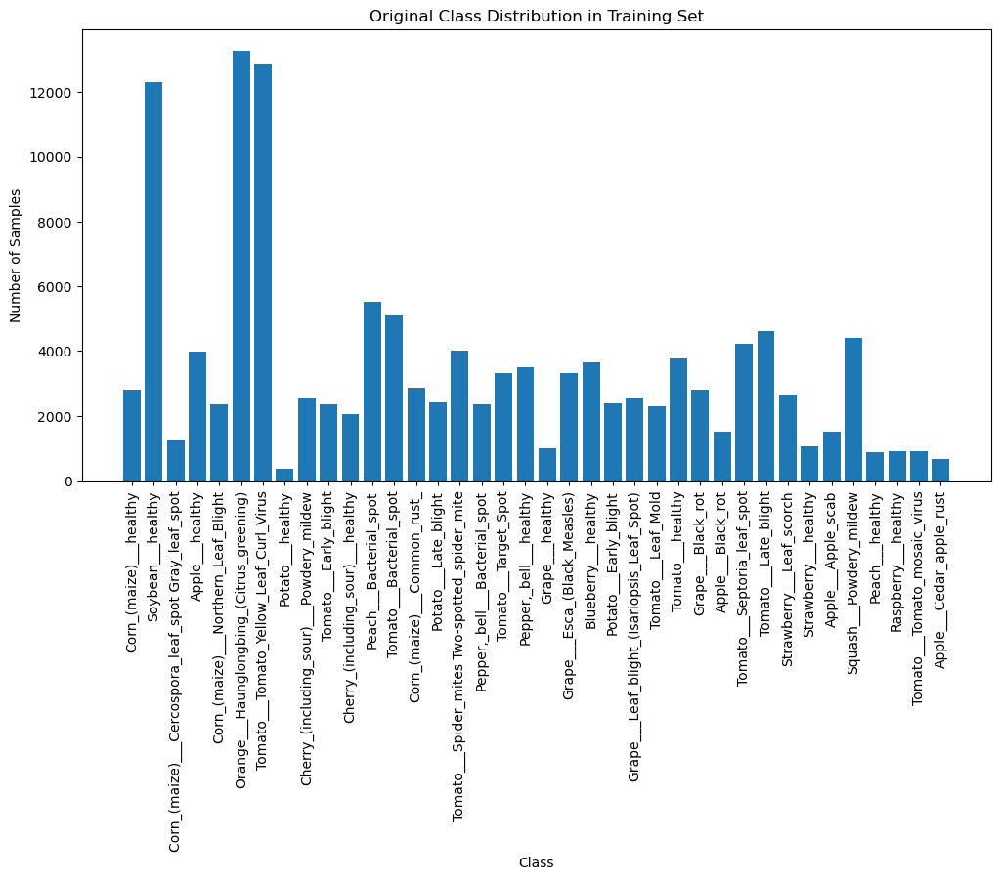

Original training dataset shape: ((130334, 12288), (130334,))
Resampled training dataset shape: ((14098, 12288), (14098,))


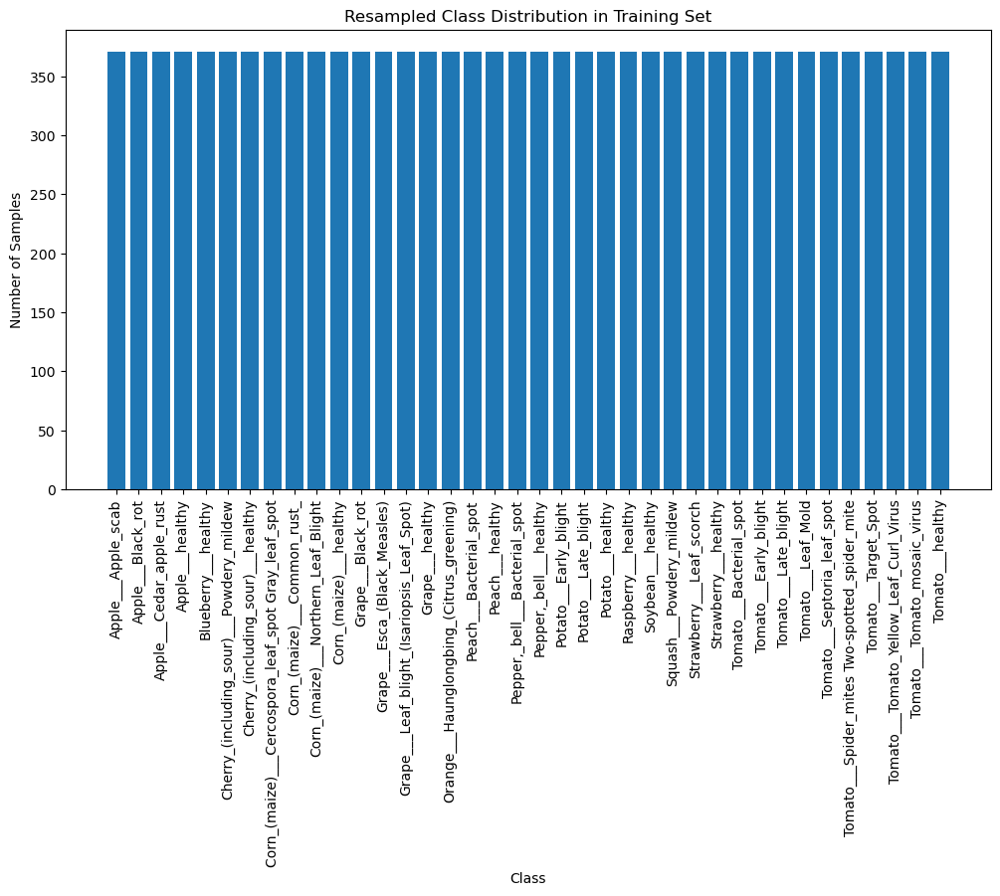

In [17]:
# Plot the original class distribution
def plot_class_distribution(y, title):
    counter = Counter(y)
    classes = list(counter.keys())
    counts = list(counter.values())
    class_names = label_encoder.inverse_transform(classes)

    plt.figure(figsize=(12, 6))
    plt.bar(class_names, counts)
    plt.xlabel('Class')
    plt.ylabel('Number of Samples')
    plt.title(title)
    plt.xticks(rotation=90)
    plt.show()

plot_class_distribution(y_train, 'Original Class Distribution in Training Set')

# Undersample the training data
rus = RandomUnderSampler(random_state=42)
X_train_resampled, y_train_resampled = rus.fit_resample(X_train, y_train)

print(f"Original training dataset shape: {X_train.shape, y_train.shape}")
print(f"Resampled training dataset shape: {X_train_resampled.shape, y_train_resampled.shape}")

# Plot the resampled class distribution
plot_class_distribution(y_train_resampled, 'Resampled Class Distribution in Training Set')

## Step 2: Train a Random Forest Classifier

In [19]:
# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'max_features': ['auto', 'sqrt', 'log2']
}

# Initialize the Random Forest classifier
random_forest = RandomForestClassifier(random_state=42)

# Use a controlled parallel backend
with joblib.parallel_backend('threading', n_jobs=-1):
    grid_search = GridSearchCV(estimator=random_forest, param_grid=param_grid, cv=3, verbose=2, n_jobs=-1)
    grid_search.fit(X_train_resampled, y_train_resampled)

# Best parameters
print(f"Best parameters: {grid_search.best_params_}")

# Train the best estimator
best_forest = grid_search.best_estimator_
best_forest.fit(X_train_resampled, y_train_resampled)

# Predict and evaluate the model
y_pred_forest = best_forest.predict(X_test)
print(f"Optimized Random Forest Model Accuracy: {accuracy_score(y_test, y_pred_forest)}")
print(classification_report(y_test, y_pred_forest, target_names=label_encoder.classes_))

Fitting 3 folds for each of 72 candidates, totalling 216 fits
[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=  38.0s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=  38.7s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=  39.5s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=  39.8s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=  40.0s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=  40.6s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=  42.0s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total

## Step 3: Visualize Results

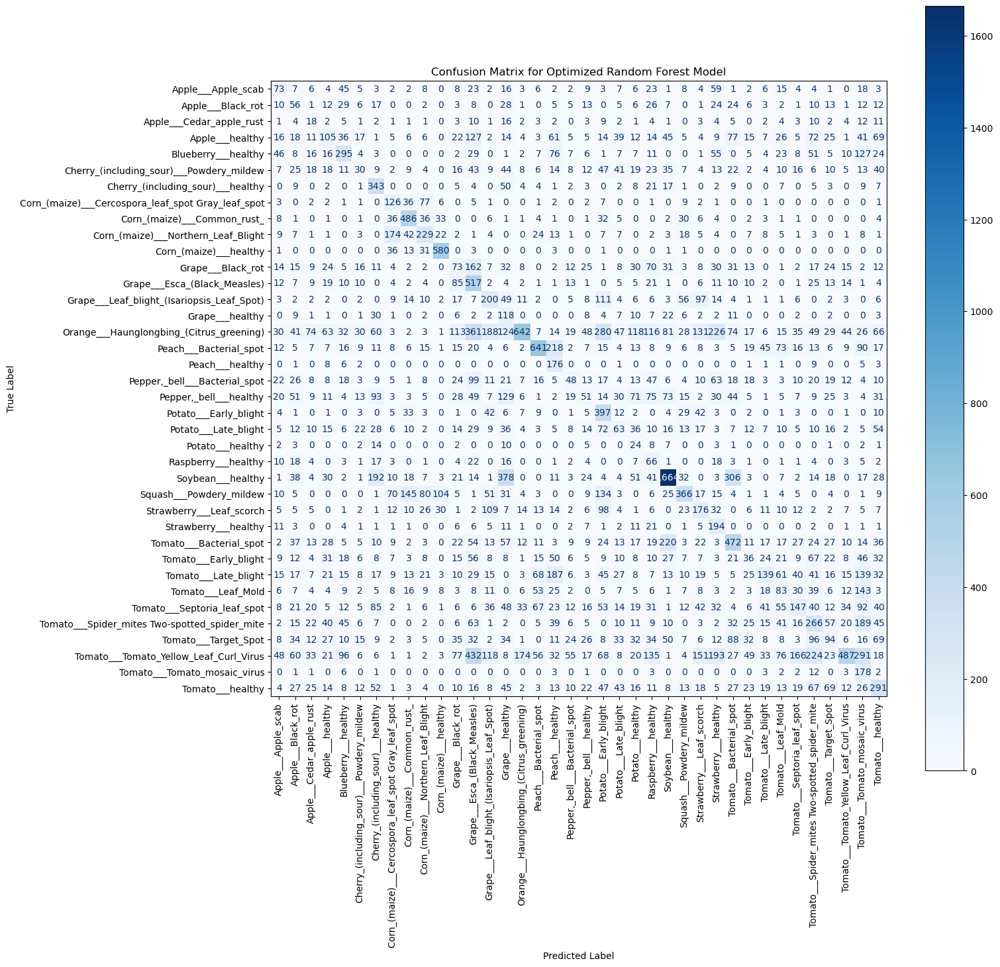

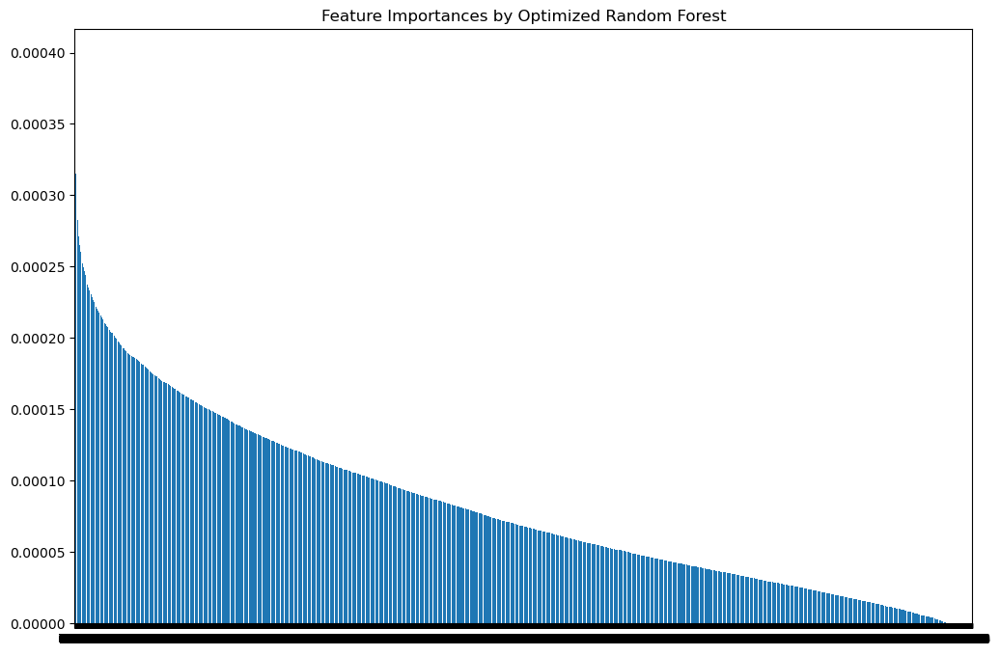

In [20]:
# Confusion Matrix for Random Forest Model
conf_matrix_forest = confusion_matrix(y_test, y_pred_forest)

fig, ax = plt.subplots(figsize=(15, 15))  # Increase the size of the figure
disp_forest = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_forest, display_labels=label_encoder.classes_)
disp_forest.plot(cmap=plt.cm.Blues, ax=ax, xticks_rotation='vertical')
plt.title('Confusion Matrix for Optimized Random Forest Model')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks(rotation=90)
plt.show()

# Plot feature importances
importances = best_forest.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(12, 8))
plt.title("Feature Importances by Optimized Random Forest")
plt.bar(range(X_train_resampled.shape[1]), importances[indices], align="center")
plt.xticks(range(X_train_resampled.shape[1]), indices)
plt.xlim([-1, X_train_resampled.shape[1]])
plt.show()


# PCA + Random Forest

## 1. Loading and Preprocessing Data

In [3]:
# Paths
data_path = 'C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/augmented'
image_size = (64, 64)  # Resize to 64x64
n_components = 100  # Number of principal components

# Load images and labels into memory
def load_data(data_path, image_size):
    categories = os.listdir(data_path)
    images = []
    labels = []
    for category in categories:
        category_path = os.path.join(data_path, category)
        if os.path.isdir(category_path):
            img_names = os.listdir(category_path)
            for img_name in img_names:
                img_path = os.path.join(category_path, img_name)
                img = cv2.imread(img_path)  # Read image with color
                if img is not None:
                    img = cv2.resize(img, image_size)  # Resize to 64x64
                    images.append(img)
                    labels.append(category)
    return np.array(images), np.array(labels)

# Encode labels
def encode_labels(labels, all_labels):
    label_encoder = LabelEncoder()
    label_encoder.fit(all_labels)
    return label_encoder.transform(labels), label_encoder

# Load and preprocess data
images, labels = load_data(data_path, image_size)
all_labels = [category for category in os.listdir(data_path)]
labels, label_encoder = encode_labels(labels, all_labels)

# Apply RandomUnderSampler to balance the data at the very beginning
rus = RandomUnderSampler(random_state=42)
images_resampled, labels_resampled = rus.fit_resample(images.reshape(len(images), -1), labels)

# Reshape images back to original dimensions
images_resampled = images_resampled.reshape(-1, image_size[0], image_size[1], 3)

## 2. PCA

Explained variance ratio: [0.17920813 0.07404606 0.07287362 0.04861304 0.03144095 0.0278532
 0.02328219 0.02201096 0.02021655 0.01517525 0.01394611 0.01330947
 0.01229732 0.01163935 0.01151524 0.01119388 0.01052013 0.00903956
 0.00702547 0.00615715 0.00611214 0.00598584 0.00591832 0.00580229
 0.00499173 0.00483672 0.00476182 0.00456917 0.00447582 0.0044475
 0.00426588 0.00373671 0.00358788 0.00351337 0.00344707 0.00340533
 0.00329239 0.00298823 0.00289185 0.0027509  0.00267577 0.00261423
 0.00256652 0.00242579 0.00238079 0.00234027 0.00219484 0.00212592
 0.00210917 0.00204592 0.00203919 0.00193651 0.00190396 0.0018582
 0.00182539 0.0017636  0.0017238  0.00167432 0.00163644 0.00161041
 0.00158819 0.00155195 0.00150164 0.001486   0.00145426 0.00144835
 0.00140006 0.00139135 0.00135519 0.00133688 0.00132846 0.00130916
 0.00128831 0.00128346 0.00122111 0.00119695 0.00117633 0.0011702
 0.00116198 0.00113703 0.00109495 0.00108765 0.00107204 0.00106526
 0.00104677 0.0010299  0.00100798 0.0009

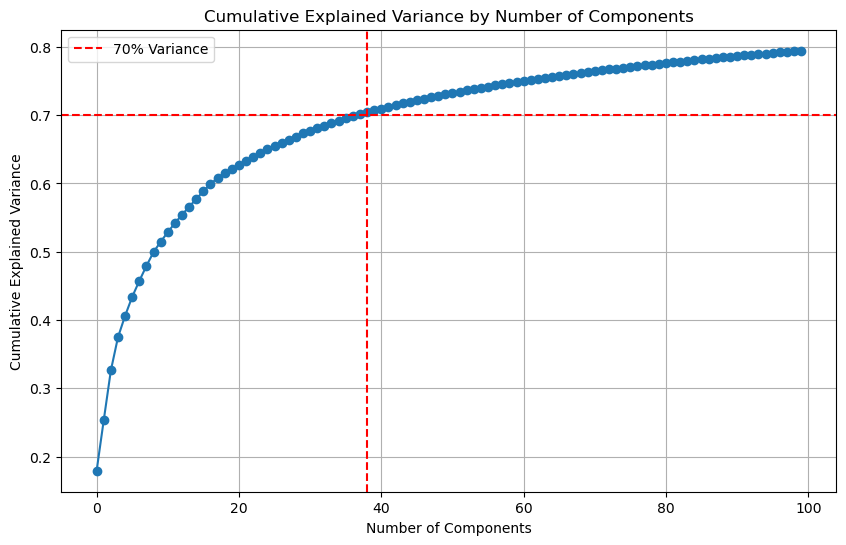

Number of components explaining 70% variance: 38
X_train_pca_70 shape: (13862, 38)
X_test_pca_70 shape: (3466, 38)


In [4]:
# Standardize the images
scaler_images = StandardScaler()
images_resampled_flattened = images_resampled.reshape(len(images_resampled), -1)
images_resampled_standardized = scaler_images.fit_transform(images_resampled_flattened)

# Apply PCA to the standardized images
#pca = PCA(n_components=n_components)
#X_pca = pca.fit_transform(images_resampled_standardized)

# Split data into training and testing sets
#X_train_pca, X_test_pca, y_train, y_test = train_test_split(X_pca, labels_resampled, test_size=0.2, random_state=42)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(images_resampled_standardized, labels_resampled, test_size=0.2, random_state=42)

# Apply PCA to the standardized images
pca = PCA(n_components=n_components)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

# Calculate cumulative explained variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
print(f"Explained variance ratio: {pca.explained_variance_ratio_}")
print(f"Cumulative explained variance: {cumulative_variance}")

n_components_70 = np.argmax(cumulative_variance >= 0.70) + 1

# Plot the cumulative explained variance
plt.figure(figsize=(10, 6))
plt.plot(cumulative_variance, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance by Number of Components')
plt.axhline(y=0.70, color='r', linestyle='--', label='70% Variance')
plt.axvline(x=n_components_70, color='r', linestyle='--')
plt.legend()
plt.grid()
plt.show()

print(f"Number of components explaining 70% variance: {n_components_70}")

# Transform the data using the selected number of components
X_train_pca_70 = X_train_pca[:, :n_components_70]
X_test_pca_70 = X_test_pca[:, :n_components_70]

print(f"X_train_pca_70 shape: {X_train_pca_70.shape}")
print(f"X_test_pca_70 shape: {X_test_pca_70.shape}")

## 3. Training and Optimizing the Random Forest Model

In [5]:
# Define the parameter grid for Random Forest
param_grid = {
    'n_estimators': [50, 100, 200, None],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4, 8],
    'max_features': ['auto', 'sqrt', 'log2', None]
}

# Initialize the GridSearchCV with RandomForestClassifier and the parameter grid
grid_search_rf = GridSearchCV(RandomForestClassifier(random_state=42), param_grid, refit=True, verbose=2, cv=3, n_jobs=-1)

# Use a controlled parallel backend
with joblib.parallel_backend('threading', n_jobs=-1):
    print("Starting Grid Search for Random Forest...")
    grid_search_rf.fit(X_train_pca_70, y_train)
    print("Grid Search completed.")

# Get the best estimator
best_rf = grid_search_rf.best_estimator_

Starting Grid Search for Random Forest...
Fitting 3 folds for each of 768 candidates, totalling 2304 fits
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=None; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=None; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=None; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=None; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=None; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=None; total time=   0.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=   4.9s
[CV] END max_depth=None, max_featu


576 fits failed out of a total of 2304.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
576 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\kheir\.conda\envs\PlantRecog\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\kheir\.conda\envs\PlantRecog\lib\site-packages\sklearn\ensemble\_forest.py", line 392, in fit
    self._validate_estimator()
  File "c:\Users\kheir\.conda\envs\PlantRecog\lib\site-packages\sklearn\ensemble\_base.py", line 133, in _validate_estimator
    type(self.n_estimators)
ValueError: n_estimators must be an integer, got <class 'NoneType'>.

One or more of the test scores ar

Grid Search completed.


## 4. Evaluating the Model and Visualizing the Results

Optimized Random Forest Model Accuracy: 0.36526255049047895
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.26      0.21      0.23       106
                                 Apple___Black_rot       0.17      0.11      0.13        76
                          Apple___Cedar_apple_rust       0.19      0.10      0.13        93
                                   Apple___healthy       0.29      0.06      0.10        95
                               Blueberry___healthy       0.37      0.37      0.37        83
          Cherry_(including_sour)___Powdery_mildew       0.26      0.15      0.19        89
                 Cherry_(including_sour)___healthy       0.32      0.39      0.35        94
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.40      0.51      0.45        96
                       Corn_(maize)___Common_rust_       0.58      0.56      0.57        97
               Corn

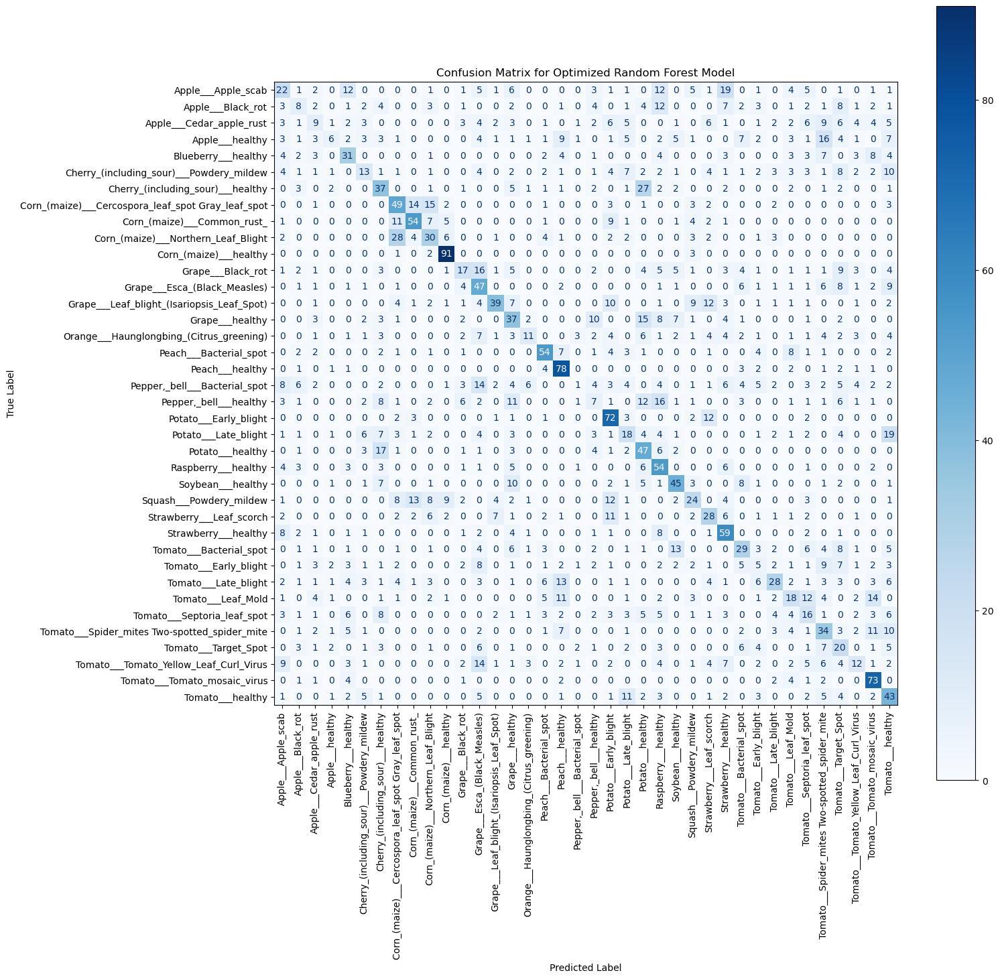

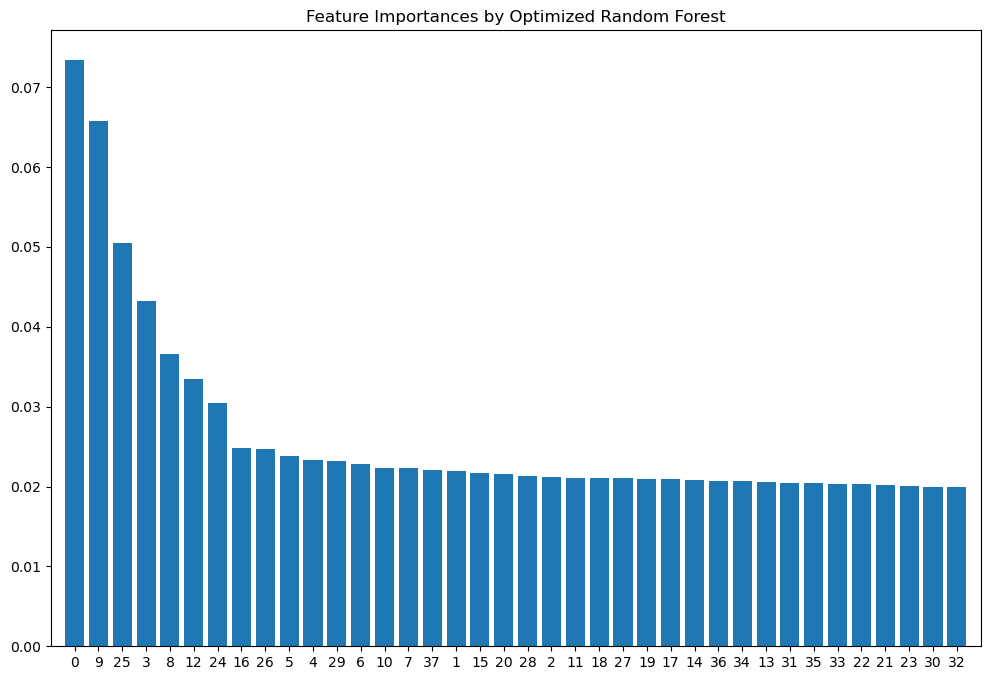

In [6]:
# Predict and evaluate the model
y_pred_rf = best_rf.predict(X_test_pca_70)
print(f"Optimized Random Forest Model Accuracy: {accuracy_score(y_test, y_pred_rf)}")
print(classification_report(y_test, y_pred_rf, target_names=label_encoder.classes_))

# Confusion Matrix for Random Forest Model
conf_matrix_rf = confusion_matrix(y_test, y_pred_rf)

fig, ax = plt.subplots(figsize=(15, 15))  # Increase the size of the figure
disp_rf = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_rf, display_labels=label_encoder.classes_)
disp_rf.plot(cmap=plt.cm.Blues, ax=ax, xticks_rotation='vertical')
plt.title('Confusion Matrix for Optimized Random Forest Model')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# Plot feature importances
importances = best_rf.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(12, 8))
plt.title("Feature Importances by Optimized Random Forest")
plt.bar(range(X_train_pca_70.shape[1]), importances[indices], align="center")
plt.xticks(range(X_train_pca_70.shape[1]), indices[:X_train_pca_70.shape[1]])
plt.xlim([-1, X_train_pca_70.shape[1]])
plt.show()

# Local Binary Pattern + KNN

## 1. Loading and Preprocessing Data

In [3]:
# Paths
data_path = 'C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/augmented'
image_size = (128, 128)  # Resize

# Load images and labels into memory
def load_data(data_path, image_size):
    categories = os.listdir(data_path)
    images = []
    labels = []
    for category in categories:
        category_path = os.path.join(data_path, category)
        if os.path.isdir(category_path):
            img_names = os.listdir(category_path)
            for img_name in img_names:
                img_path = os.path.join(category_path, img_name)
                img = cv2.imread(img_path)  # Read image with color
                if img is not None:
                    img = cv2.resize(img, image_size)  # Resize
                    images.append(img)
                    labels.append(category)
    return np.array(images), np.array(labels)

# Encode labels
def encode_labels(labels, all_labels):
    label_encoder = LabelEncoder()
    label_encoder.fit(all_labels)
    return label_encoder.transform(labels), label_encoder

# Load and preprocess data
images, labels = load_data(data_path, image_size)
all_labels = [category for category in os.listdir(data_path)]
labels, label_encoder = encode_labels(labels, all_labels)

# Apply RandomUnderSampler to balance the data at the very beginning
rus = RandomUnderSampler(random_state=42)
images_resampled, labels_resampled = rus.fit_resample(images.reshape(len(images), -1), labels)

# Reshape images back to original dimensions
images_resampled = images_resampled.reshape(-1, image_size[0], image_size[1], 3)

## 2. Extracting LBP Features

In [4]:
# LBP feature extraction
def extract_lbp_features(image, P=8, R=1):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)  # Convert to grayscale
    lbp = local_binary_pattern(gray_image, P, R, method="uniform")
    (hist, _) = np.histogram(lbp.ravel(), bins=np.arange(0, P + 3), range=(0, P + 2))
    hist = hist.astype("float")
    hist /= (hist.sum() + 1e-6)  # Normalize the histogram
    return hist

# Extract LBP features from all images in parallel
def parallel_extract_lbp_features(images, P, R):
    with joblib.parallel_backend('threading', n_jobs=-1):
        lbp_features = Parallel(n_jobs=-1)(delayed(extract_lbp_features)(image, P, R) for image in tqdm(images, desc="Extracting LBP Features"))
    return np.array(lbp_features)

# Precompute LBP features
P_values = [8, 16, 24]
R_values = [1, 2, 3]
lbp_feature_sets = {}
for P in P_values:
    for R in R_values:
        key = f"P{P}_R{R}"
        lbp_feature_sets[key] = parallel_extract_lbp_features(images_resampled, P, R)

# Example: Using LBP features with P=8 and R=1
lbp_features = lbp_feature_sets["P8_R1"]
scaler_lbp = StandardScaler()
lbp_features_resampled = scaler_lbp.fit_transform(lbp_features)

Extracting LBP Features: 100%|██████████| 17328/17328 [00:50<00:00, 345.85it/s]


## 3. Training and Optimizing the k-NN Model

Starting Grid Search for LBP (P=8, R=1) and k-NN...
Fitting 3 folds for each of 1280 candidates, totalling 3840 fits
[CV] END knn__algorithm=auto, knn__leaf_size=10, knn__metric=euclidean, knn__n_neighbors=1, knn__weights=distance; total time=   0.4s
[CV] END knn__algorithm=auto, knn__leaf_size=10, knn__metric=euclidean, knn__n_neighbors=1, knn__weights=distance; total time=   0.4s
[CV] END knn__algorithm=auto, knn__leaf_size=10, knn__metric=euclidean, knn__n_neighbors=1, knn__weights=distance; total time=   0.5s
[CV] END knn__algorithm=auto, knn__leaf_size=10, knn__metric=euclidean, knn__n_neighbors=3, knn__weights=distance; total time=   0.5s
[CV] END knn__algorithm=auto, knn__leaf_size=10, knn__metric=euclidean, knn__n_neighbors=3, knn__weights=distance; total time=   0.6s
[CV] END knn__algorithm=auto, knn__leaf_size=10, knn__metric=euclidean, knn__n_neighbors=5, knn__weights=distance; total time=   0.7s
[CV] END knn__algorithm=auto, knn__leaf_size=10, knn__metric=euclidean, knn__n_

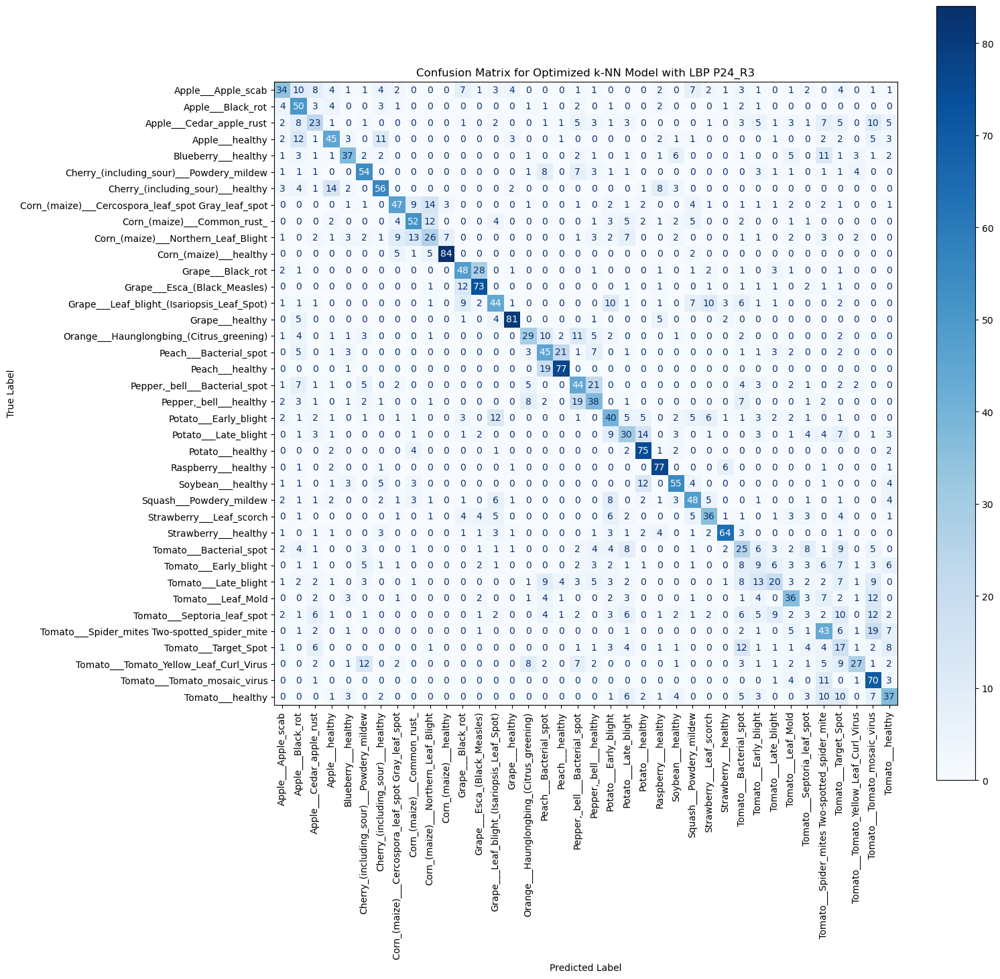

In [10]:
# Define the expanded parameter grid for LBP and k-NN
param_grid = {
    'knn__n_neighbors': [1, 3, 5, 7, 11, 13, 17, 19],
    'knn__weights': ['uniform', 'distance'],
    'knn__metric': ['euclidean', 'manhattan', 'chebyshev', 'minkowski'],
    'knn__algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'knn__leaf_size': [10, 20, 30, 40, 50]
}

# Function to perform grid search for each LBP feature set
def perform_grid_search(lbp_features, labels_resampled, param_grid, P, R):
    X_train, X_test, y_train, y_test = train_test_split(lbp_features, labels_resampled, test_size=0.2, random_state=42)
    
    pipeline = Pipeline([
        ('scaler', StandardScaler()),
        ('knn', KNeighborsClassifier())
    ])
    
    grid_search = GridSearchCV(pipeline, param_grid, refit=True, verbose=2, cv=3, n_jobs=-1)
    
    with joblib.parallel_backend('threading', n_jobs=-1):
        print(f"Starting Grid Search for LBP (P={P}, R={R}) and k-NN...")
        grid_search.fit(X_train, y_train)
        print("Grid Search completed.")
    
    best_knn = grid_search.best_estimator_
    
    y_pred_knn = best_knn.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred_knn)
    report = classification_report(y_test, y_pred_knn, target_names=label_encoder.classes_)
    
    return best_knn, accuracy, report, grid_search.best_params_

# Perform grid search for each LBP feature set
best_models = {}
for P in P_values:
    for R in R_values:
        key = f"P{P}_R{R}"
        lbp_features = lbp_feature_sets[key]
        lbp_features_resampled = scaler_lbp.fit_transform(lbp_features)
        best_knn, accuracy, report, best_params = perform_grid_search(lbp_features_resampled, labels_resampled, param_grid, P, R)
        best_models[key] = {
            'model': best_knn,
            'accuracy': accuracy,
            'report': report,
            'params': best_params
        }

# Display the results
for key, value in best_models.items():
    print(f"Results for LBP with {key}:")
    print(f"Best Params: {value['params']}")
    print(f"Accuracy: {value['accuracy']}")
    print(value['report'])
    print("\n")

# Example: Plot confusion matrix for one of the best models
best_key = max(best_models, key=lambda x: best_models[x]['accuracy'])
best_model = best_models[best_key]['model']
X_train, X_test, y_train, y_test = train_test_split(lbp_feature_sets[best_key], labels_resampled, test_size=0.2, random_state=42)
y_pred_knn = best_model.predict(scaler_lbp.transform(X_test))

conf_matrix_knn = confusion_matrix(y_test, y_pred_knn)
fig, ax = plt.subplots(figsize=(15, 15))  # Increase the size of the figure
disp_knn = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_knn, display_labels=label_encoder.classes_)
disp_knn.plot(cmap=plt.cm.Blues, ax=ax, xticks_rotation='vertical')
plt.title(f'Confusion Matrix for Optimized k-NN Model with LBP {best_key}')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

## 4. Evaluating the Model and Visualizing the Results

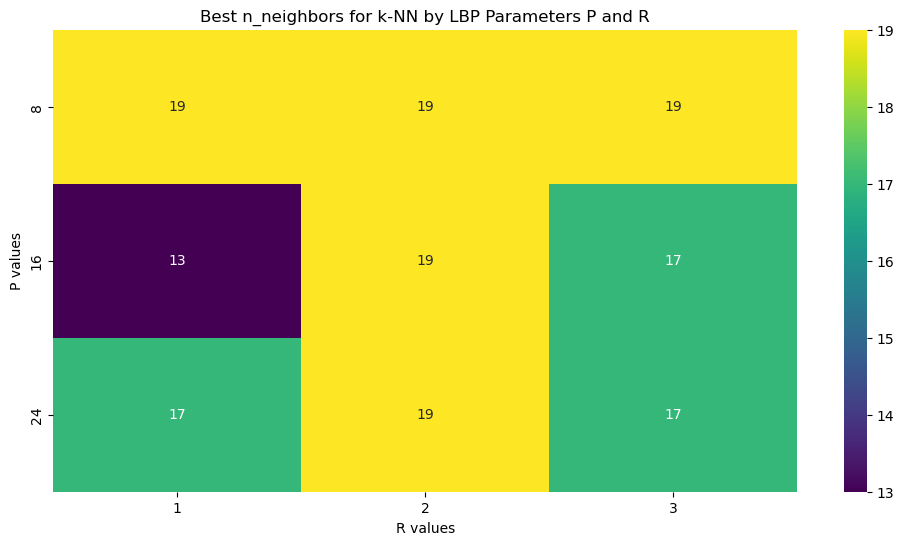

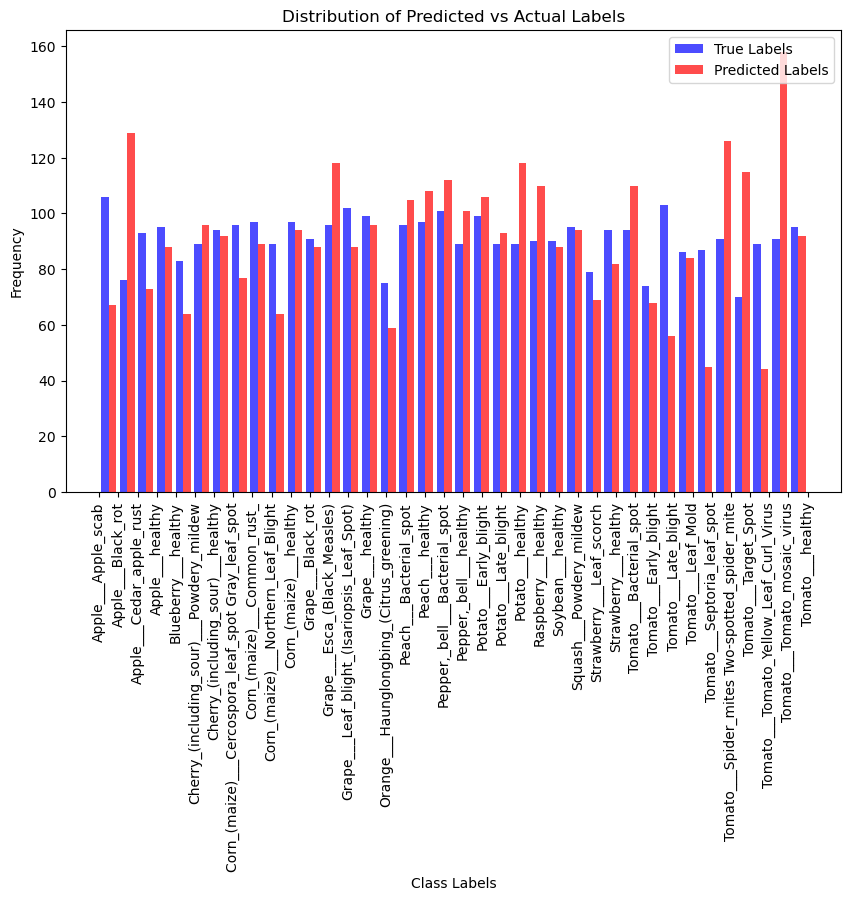

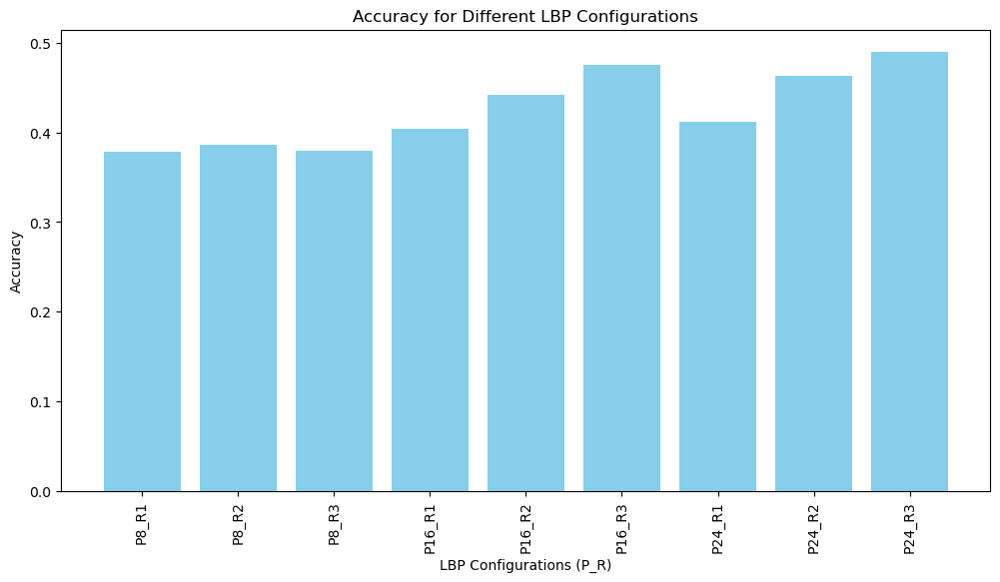

In [14]:
# Visualize the best parameters for LBP and k-NN
best_params_df = pd.DataFrame([value['params'] for key, value in best_models.items()])
best_params_df['P'] = [int(key.split('_')[0][1:]) for key in best_models.keys()]
best_params_df['R'] = [int(key.split('_')[1][1:]) for key in best_models.keys()]

plt.figure(figsize=(12, 6))
sns.heatmap(best_params_df.pivot("P", "R", "knn__n_neighbors"), annot=True, fmt="d", cmap="viridis")
plt.title('Best n_neighbors for k-NN by LBP Parameters P and R')
plt.xlabel('R values')
plt.ylabel('P values')
plt.show()

# Visualize the distribution of predicted vs actual labels
plt.figure(figsize=(10, 6))
plt.hist([y_test, y_pred_knn], bins=len(label_encoder.classes_), color=['blue', 'red'], label=['True Labels', 'Predicted Labels'], alpha=0.7)
plt.xticks(ticks=np.arange(len(label_encoder.classes_)), labels=label_encoder.classes_, rotation=90)
plt.xlabel('Class Labels')
plt.ylabel('Frequency')
plt.title('Distribution of Predicted vs Actual Labels')
plt.legend(loc='upper right')
plt.show()

# Visualize the accuracies for each LBP configuration
accuracies = [value['accuracy'] for value in best_models.values()]
keys = list(best_models.keys())

plt.figure(figsize=(12, 6))
plt.bar(keys, accuracies, color='skyblue')
plt.xticks(rotation=90)
plt.xlabel('LBP Configurations (P_R)')
plt.ylabel('Accuracy')
plt.title('Accuracy for Different LBP Configurations')
plt.show()

# LDA + KNN

## 1. Loading and Preprocessing Data

In [2]:
# Paths
data_path = 'C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/augmented'
image_size = (128, 128)  # Resize to 128x128

# Load images and labels into memory
def load_data(data_path, image_size):
    categories = os.listdir(data_path)
    images = []
    labels = []
    for category in categories:
        category_path = os.path.join(data_path, category)
        if os.path.isdir(category_path):
            img_names = os.listdir(category_path)
            for img_name in img_names:
                img_path = os.path.join(category_path, img_name)
                img = cv2.imread(img_path)  # Read image with color
                if img is not None:
                    img = cv2.resize(img, image_size)  # Resize
                    images.append(img)
                    labels.append(category)
    return np.array(images), np.array(labels)

# Encode labels
def encode_labels(labels, all_labels):
    label_encoder = LabelEncoder()
    label_encoder.fit(all_labels)
    return label_encoder.transform(labels), label_encoder

# Load and preprocess data
images, labels = load_data(data_path, image_size)
all_labels = [category for category in os.listdir(data_path)]
labels, label_encoder = encode_labels(labels, all_labels)

# Apply RandomUnderSampler to balance the data at the very beginning
rus = RandomUnderSampler(random_state=42)
images_resampled, labels_resampled = rus.fit_resample(images.reshape(len(images), -1), labels)

# Reshape images back to original dimensions
images_resampled = images_resampled.reshape(-1, image_size[0], image_size[1], 3)

# Standardize the images
scaler_images = StandardScaler()
images_resampled_flattened = images_resampled.reshape(len(images_resampled), -1)
images_resampled_standardized = scaler_images.fit_transform(images_resampled_flattened)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(images_resampled_standardized, labels_resampled, test_size=0.2, random_state=42)

## 2. Dimensionality Reduction Using PCA

In [3]:
# Apply LDA
lda = LDA()
X_train_lda = lda.fit_transform(X_train, y_train)
X_test_lda = lda.transform(X_test)

## 3. Training and Optimizing the k-NN Model

In [30]:
# Define the expanded parameter grid for k-NN
param_grid = {
    'n_neighbors': [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'chebyshev', 'minkowski'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'leaf_size': [10, 20, 30, 40, 50]
}

# Initialize the GridSearchCV with KNeighborsClassifier and the parameter grid
grid_search_knn = GridSearchCV(KNeighborsClassifier(), param_grid, refit=True, verbose=2, cv=3, n_jobs=-1)

# Use a controlled parallel backend
with joblib.parallel_backend('threading', n_jobs=-1):
    print("Starting Grid Search for k-NN...")
    grid_search_knn.fit(X_train_pca_70, y_train)
    print("Grid Search completed.")

# Get the best estimator
best_knn = grid_search_knn.best_estimator_

Starting Grid Search for k-NN...
Fitting 3 folds for each of 1760 candidates, totalling 5280 fits
[CV] END algorithm=auto, leaf_size=10, metric=euclidean, n_neighbors=1, weights=distance; total time=   4.7s
[CV] END algorithm=auto, leaf_size=10, metric=euclidean, n_neighbors=1, weights=distance; total time=   4.9s
[CV] END algorithm=auto, leaf_size=10, metric=euclidean, n_neighbors=1, weights=distance; total time=   4.9s
[CV] END algorithm=auto, leaf_size=10, metric=euclidean, n_neighbors=3, weights=distance; total time=   5.0s[CV] END algorithm=auto, leaf_size=10, metric=euclidean, n_neighbors=3, weights=distance; total time=   5.0s

[CV] END algorithm=auto, leaf_size=10, metric=euclidean, n_neighbors=5, weights=distance; total time=   5.0s
[CV] END algorithm=auto, leaf_size=10, metric=euclidean, n_neighbors=3, weights=distance; total time=   5.1s
[CV] END algorithm=auto, leaf_size=10, metric=euclidean, n_neighbors=5, weights=distance; total time=   5.1s
[CV] END algorithm=auto, leaf_

In [4]:
# Define the expanded parameter grid for k-NN
param_grid = {
    'n_neighbors': [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'chebyshev', 'minkowski'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'leaf_size': [10, 20, 30, 40, 50]
}

# Initialize the GridSearchCV with KNeighborsClassifier and the parameter grid
grid_search_knn = GridSearchCV(KNeighborsClassifier(), param_grid, refit=True, verbose=2, cv=3, n_jobs=-1)

# Use a controlled parallel backend
with joblib.parallel_backend('threading', n_jobs=-1):
    print("Starting Grid Search for k-NN...")
    grid_search_knn.fit(X_train_lda, y_train)
    print("Grid Search completed.")

# Get the best estimator
best_knn = grid_search_knn.best_estimator_

# Predict and evaluate the model
y_pred_knn = best_knn.predict(X_test_lda)
print(f"Optimized k-NN Model Accuracy: {accuracy_score(y_test, y_pred_knn)}")
print(classification_report(y_test, y_pred_knn, target_names=label_encoder.classes_))

Starting Grid Search for k-NN...
Fitting 3 folds for each of 1760 candidates, totalling 5280 fits
[CV] END algorithm=auto, leaf_size=10, metric=euclidean, n_neighbors=1, weights=distance; total time=   4.1s
[CV] END algorithm=auto, leaf_size=10, metric=euclidean, n_neighbors=1, weights=distance; total time=   4.2s
[CV] END algorithm=auto, leaf_size=10, metric=euclidean, n_neighbors=1, weights=distance; total time=   4.2s
[CV] END algorithm=auto, leaf_size=10, metric=euclidean, n_neighbors=3, weights=distance; total time=   4.2s
[CV] END algorithm=auto, leaf_size=10, metric=euclidean, n_neighbors=3, weights=distance; total time=   4.2s
[CV] END algorithm=auto, leaf_size=10, metric=euclidean, n_neighbors=3, weights=distance; total time=   4.2s
[CV] END algorithm=auto, leaf_size=10, metric=euclidean, n_neighbors=5, weights=distance; total time=   4.2s
[CV] END algorithm=auto, leaf_size=10, metric=euclidean, n_neighbors=5, weights=distance; total time=   4.5s
[CV] END algorithm=auto, leaf_

## 4. Evaluating the Model and Visualizing the Results

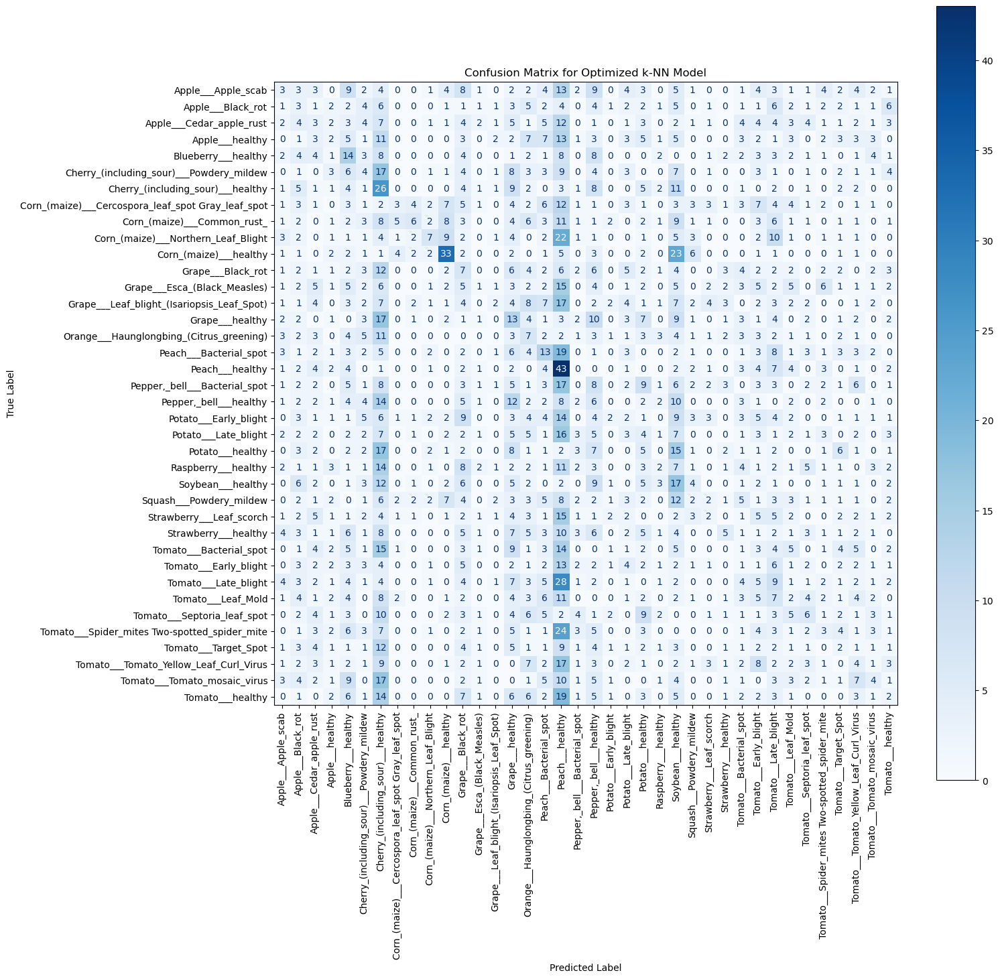

In [7]:
# Confusion Matrix for k-NN Model
conf_matrix_knn = confusion_matrix(y_test, y_pred_knn)

fig, ax = plt.subplots(figsize=(15, 15))  # Increase the size of the figure
disp_knn = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_knn, display_labels=label_encoder.classes_)
disp_knn.plot(cmap=plt.cm.Blues, ax=ax, xticks_rotation='vertical')
plt.title('Confusion Matrix for Optimized k-NN Model')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# LDA + Logistic Regression

## 1. Loading and Preprocessing Data

In [3]:
# Paths
data_path = 'C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/augmented'
image_size = (64, 64)  # Resize to 64x64

# Load images and labels into memory
def load_data(data_path, image_size):
    categories = os.listdir(data_path)
    images = []
    labels = []
    for category in categories:
        category_path = os.path.join(data_path, category)
        if os.path.isdir(category_path):
            img_names = os.listdir(category_path)
            for img_name in img_names:
                img_path = os.path.join(category_path, img_name)
                img = cv2.imread(img_path)  # Read image with color
                if img is not None:
                    img = cv2.resize(img, image_size)  # Resize to 64x64
                    images.append(img)
                    labels.append(category)
    return np.array(images), np.array(labels)

# Encode labels
def encode_labels(labels, all_labels):
    label_encoder = LabelEncoder()
    label_encoder.fit(all_labels)
    return label_encoder.transform(labels), label_encoder

# Load and preprocess data
images, labels = load_data(data_path, image_size)
all_labels = [category for category in os.listdir(data_path)]
labels, label_encoder = encode_labels(labels, all_labels)

# Apply RandomUnderSampler to balance the data at the very beginning
rus = RandomUnderSampler(random_state=42)
images_resampled, labels_resampled = rus.fit_resample(images.reshape(len(images), -1), labels)

# Reshape images back to original dimensions
images_resampled = images_resampled.reshape(-1, image_size[0], image_size[1], 3)

In [4]:
# Flatten the images
images_resampled_flattened = images_resampled.reshape(len(images_resampled), -1)

# Standardize the images
scaler_images = StandardScaler()
images_resampled_standardized = scaler_images.fit_transform(images_resampled_flattened)

## 2. Dimensionality Reduction Using LDA

In [5]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(images_resampled_standardized, labels_resampled, test_size=0.2, random_state=42)

# Apply LDA to the standardized images
lda = LDA()
X_train_lda = lda.fit_transform(X_train, y_train)
X_test_lda = lda.transform(X_test)

## 3. Training and Optimizing the Logistic Regression Model

In [6]:
# Define the parameter grid for Logistic Regression
#param_grid = {
#    'C': [0.01, 0.1, 1, 10, 100],
#    'penalty': ['l1', 'l2'],
#    'solver': ['liblinear', 'newton-cg', 'lbfgs', 'sag', 'saga']
#}
param_grid = {
    'penalty': ['l1', 'l2', 'none'],  # Regularization type
    'C': [0.001, 0.01, 0.1, 1, 10, 100],  # Inverse of regularization strength
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],  # Optimization algorithm
}

# Initialize the GridSearchCV with LogisticRegression and the parameter grid
grid_search_lr = GridSearchCV(LogisticRegression(max_iter=10000), param_grid, refit=True, verbose=2, cv=3, n_jobs=-1)

# Use a controlled parallel backend
with joblib.parallel_backend('threading', n_jobs=-1):
    print("Starting Grid Search for Logistic Regression...")
    grid_search_lr.fit(X_train_lda, y_train)
    print("Grid Search completed.")

# Get the best estimator
best_lr = grid_search_lr.best_estimator_


Starting Grid Search for Logistic Regression...
Fitting 3 folds for each of 90 candidates, totalling 270 fits
[CV] END ..............C=0.001, penalty=l1, solver=newton-cg; total time=   0.0s
[CV] END ....................C=0.001, penalty=l1, solver=sag; total time=   0.0s
[CV] END ..................C=0.001, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END ....................C=0.001, penalty=l1, solver=sag; total time=   0.0s
[CV] END ..................C=0.001, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END ....................C=0.001, penalty=l1, solver=sag; total time=   0.0s
[CV] END ..............C=0.001, penalty=l1, solver=newton-cg; total time=   0.0s
[CV] END ..............C=0.001, penalty=l1, solver=newton-cg; total time=   0.0s
[CV] END ..................C=0.001, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END ..............C=0.001, penalty=l1, solver=liblinear; total time=   0.9s
[CV] END ..............C=0.001, penalty=l1, solver=liblinear; total time=   0.9s

Setting penalty='none' will ignore the C and l1_ratio parameters
Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ..............C=0.001, penalty=l2, solver=liblinear; total time=   4.1s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ..............C=0.001, penalty=l2, solver=liblinear; total time=   4.4s
[CV] END ..............C=0.001, penalty=l2, solver=liblinear; total time=   4.4s


Setting penalty='none' will ignore the C and l1_ratio parameters
Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ..................C=0.001, penalty=l2, solver=lbfgs; total time=   4.9s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ................C=0.001, penalty=none, solver=lbfgs; total time=   1.1s
[CV] END ............C=0.001, penalty=none, solver=liblinear; total time=   0.0s
[CV] END ............C=0.001, penalty=none, solver=liblinear; total time=   0.0s
[CV] END ............C=0.001, penalty=none, solver=liblinear; total time=   0.0s
[CV] END ................C=0.001, penalty=none, solver=lbfgs; total time=   1.2s


Setting penalty='none' will ignore the C and l1_ratio parameters
Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ..................C=0.001, penalty=l2, solver=lbfgs; total time=   5.9s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ................C=0.001, penalty=none, solver=lbfgs; total time=   1.2s
[CV] END ..................C=0.001, penalty=l2, solver=lbfgs; total time=   6.2s
[CV] END ............C=0.001, penalty=none, solver=newton-cg; total time=   2.2s


Setting penalty='none' will ignore the C and l1_ratio parameters
Setting penalty='none' will ignore the C and l1_ratio parameters
Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ............C=0.001, penalty=none, solver=newton-cg; total time=   5.6s
[CV] END ...............C=0.01, penalty=l1, solver=newton-cg; total time=   0.0s
[CV] END ...............C=0.01, penalty=l1, solver=newton-cg; total time=   0.0s
[CV] END ...............C=0.01, penalty=l1, solver=newton-cg; total time=   0.0s
[CV] END ...................C=0.01, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END ............C=0.001, penalty=none, solver=newton-cg; total time=   5.6s
[CV] END ...............C=0.01, penalty=l1, solver=liblinear; total time=   1.1s
[CV] END ...............C=0.01, penalty=l1, solver=liblinear; total time=   1.0s
[CV] END .....................C=0.01, penalty=l1, solver=sag; total time=   0.0s
[CV] END .....................C=0.01, penalty=l1, solver=sag; total time=   0.0s
[CV] END ...................

Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ...............C=0.01, penalty=l2, solver=newton-cg; total time=  12.3s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ...................C=0.001, penalty=l2, solver=saga; total time=  24.8s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ...................C=0.001, penalty=l2, solver=saga; total time=  25.6s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ...................C=0.001, penalty=l2, solver=saga; total time=  25.9s
[CV] END .................C=0.01, penalty=none, solver=lbfgs; total time=   1.3s
[CV] END .............C=0.01, penalty=none, solver=newton-cg; total time=   6.4s
[CV] END .............C=0.01, penalty=none, solver=liblinear; total time=   0.0s
[CV] END .............C=0.01, penalty=none, solver=liblinear; total time=   0.0s
[CV] END .............C=0.01, penalty=none, solver=liblinear; total time=   0.0s


Setting penalty='none' will ignore the C and l1_ratio parameters
Setting penalty='none' will ignore the C and l1_ratio parameters
Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END .............C=0.01, penalty=none, solver=newton-cg; total time=   2.4s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END .................C=0.01, penalty=none, solver=lbfgs; total time=   0.9s
[CV] END .................C=0.01, penalty=none, solver=lbfgs; total time=   1.0s


Setting penalty='none' will ignore the C and l1_ratio parameters
Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END .............C=0.01, penalty=none, solver=newton-cg; total time=   5.5s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ..................C=0.001, penalty=none, solver=sag; total time=  26.2s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END .....................C=0.01, penalty=l2, solver=sag; total time=  15.4s
[CV] END ................C=0.1, penalty=l1, solver=newton-cg; total time=   0.0s
[CV] END ................C=0.1, penalty=l1, solver=newton-cg; total time=   0.0s
[CV] END ................C=0.1, penalty=l1, solver=newton-cg; total time=   0.0s
[CV] END ....................C=0.1, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END ....................C=0.1, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END ....................C=0.1, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END ................C=0.1, penalty=l1, solver=liblinear; total time=   1.5s
[CV] END .....................C=0.01, penalty=l2, solver=sag; total time=  16.5s
[CV] END .....................C=0.01, penalty=l2, solver=sag; total time=  16.4s
[CV] END ......................C=0.1, penalty=l1, solver=sag; total time=   0.0s
[CV] END ......................C=0.1, penalty=l1, solver=sag; total time=   0.0s
[CV] END ...................

Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ......................C=0.1, penalty=l2, solver=sag; total time=  11.2s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ......................C=0.1, penalty=l2, solver=sag; total time=  11.2s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ..............C=0.1, penalty=none, solver=newton-cg; total time=   2.2s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ..................C=0.1, penalty=none, solver=lbfgs; total time=   1.0s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ..............C=0.1, penalty=none, solver=newton-cg; total time=   5.4s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ...................C=0.01, penalty=none, solver=sag; total time=  51.2s
[CV] END ..............C=0.1, penalty=none, solver=liblinear; total time=   0.0s
[CV] END ..............C=0.1, penalty=none, solver=liblinear; total time=   0.0s
[CV] END ..............C=0.1, penalty=none, solver=liblinear; total time=   0.0s
[CV] END ..................C=0.1, penalty=none, solver=lbfgs; total time=   1.0s


Setting penalty='none' will ignore the C and l1_ratio parameters
Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ..............C=0.1, penalty=none, solver=newton-cg; total time=   5.2s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ..................C=0.1, penalty=none, solver=lbfgs; total time=   1.1s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ....................C=0.01, penalty=l1, solver=saga; total time= 1.3min


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END .....................C=0.1, penalty=l2, solver=saga; total time=  22.1s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END .....................C=0.1, penalty=l2, solver=saga; total time=  25.6s
[CV] END ..................C=1, penalty=l1, solver=newton-cg; total time=   0.0s
[CV] END ..................C=1, penalty=l1, solver=newton-cg; total time=   0.0s
[CV] END ..................C=1, penalty=l1, solver=newton-cg; total time=   0.0s
[CV] END ......................C=1, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END ......................C=1, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END ......................C=1, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=none, solver=sag; total time= 1.1min
[CV] END ..................C=1, penalty=l1, solver=liblinear; total time=   1.8s
[CV] END ....................C=0.01, penalty=l1, solver=saga; total time= 1.4min
[CV] END ........................C=1, penalty=l1, solver=sag; total time=   0.0s
[CV] END ........................C=1, penalty=l1, solver=sag; total time=   0.0s
[CV] END ...................

Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ......................C=1, penalty=none, solver=sag; total time= 1.1min


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ...............C=10, penalty=none, solver=newton-cg; total time=   7.6s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ...............C=10, penalty=none, solver=newton-cg; total time=   7.1s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ...................C=10, penalty=none, solver=lbfgs; total time=   1.6s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ...............C=10, penalty=none, solver=newton-cg; total time=   2.8s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ...................C=10, penalty=none, solver=lbfgs; total time=   1.4s
[CV] END ...............C=10, penalty=none, solver=liblinear; total time=   0.0s
[CV] END ...............C=10, penalty=none, solver=liblinear; total time=   0.0s
[CV] END ...............C=10, penalty=none, solver=liblinear; total time=   0.0s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ...................C=10, penalty=none, solver=lbfgs; total time=   1.5s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ...................C=0.1, penalty=none, solver=saga; total time= 2.1min


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ...................C=0.1, penalty=none, solver=saga; total time= 2.3min


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ...................C=0.1, penalty=none, solver=saga; total time= 2.5min


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END .....................C=10, penalty=none, solver=sag; total time=  20.8s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END .....................C=10, penalty=none, solver=sag; total time=  54.3s
[CV] END ................C=100, penalty=l1, solver=newton-cg; total time=   0.0s
[CV] END ................C=100, penalty=l1, solver=newton-cg; total time=   0.0s
[CV] END ................C=100, penalty=l1, solver=newton-cg; total time=   0.0s
[CV] END ....................C=100, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END ....................C=100, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END ....................C=100, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END ................C=100, penalty=l1, solver=liblinear; total time=   2.4s
[CV] END ................C=100, penalty=l1, solver=liblinear; total time=   2.1s
[CV] END ................C=100, penalty=l1, solver=liblinear; total time=   1.5s
[CV] END ......................C=100, penalty=l1, solver=sag; total time=   0.0s
[CV] END ......................C=100, penalty=l1, solver=sag; total time=   0.0s
[CV] END ...................

Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ..............C=100, penalty=none, solver=newton-cg; total time=   4.7s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END .......................C=1, penalty=l1, solver=saga; total time= 4.1min


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ..............C=100, penalty=none, solver=newton-cg; total time=   1.9s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ..................C=100, penalty=none, solver=lbfgs; total time=   1.2s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ..............C=100, penalty=none, solver=newton-cg; total time=   5.4s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ..................C=100, penalty=none, solver=lbfgs; total time=   1.5s
[CV] END ..............C=100, penalty=none, solver=liblinear; total time=   0.0s
[CV] END ..............C=100, penalty=none, solver=liblinear; total time=   0.0s
[CV] END ..............C=100, penalty=none, solver=liblinear; total time=   0.0s
[CV] END ....................C=10, penalty=none, solver=saga; total time= 1.8min


Setting penalty='none' will ignore the C and l1_ratio parameters
Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ..................C=100, penalty=none, solver=lbfgs; total time=   1.9s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ......................C=100, penalty=l2, solver=sag; total time=  47.5s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ......................C=100, penalty=l2, solver=sag; total time=  46.9s


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ....................C=10, penalty=none, solver=saga; total time= 2.3min


Setting penalty='none' will ignore the C and l1_ratio parameters


[CV] END ....................C=100, penalty=none, solver=sag; total time=  16.3s
[CV] END .......................C=1, penalty=l1, solver=saga; total time= 4.7min
[CV] END ....................C=10, penalty=none, solver=saga; total time= 2.3min
[CV] END ....................C=100, penalty=none, solver=sag; total time=  52.0s
[CV] END ....................C=100, penalty=none, solver=sag; total time=  53.3s
[CV] END .......................C=10, penalty=l2, solver=sag; total time= 4.1min
[CV] END .......................C=10, penalty=l2, solver=sag; total time= 4.1min
[CV] END .....................C=100, penalty=l2, solver=saga; total time= 2.1min
[CV] END .....................C=100, penalty=l2, solver=saga; total time= 1.8min
[CV] END .....................C=100, penalty=l2, solver=saga; total time= 2.3min
[CV] END ......................C=10, penalty=l1, solver=saga; total time= 4.9min
[CV] END ...................C=100, penalty=none, solver=saga; total time= 1.7min
[CV] END ...................


72 fits failed out of a total of 270.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
18 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\kheir\.conda\envs\PlantRecog\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\kheir\.conda\envs\PlantRecog\lib\site-packages\sklearn\linear_model\_logistic.py", line 1461, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\Users\kheir\.conda\envs\PlantRecog\lib\site-packages\sklearn\linear_model\_logistic.py", line 449, in _check_solver
    % (solver, penalty)
ValueError: Solver newton-cg supports only 'l2' or 'none' penalties

Grid Search completed.


## 4. Evaluating the Model and Visualizing the Results

Optimized Logistic Regression Model Accuracy: 0.05308713214079631
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.05      0.04      0.04       106
                                 Apple___Black_rot       0.04      0.03      0.03        76
                          Apple___Cedar_apple_rust       0.06      0.03      0.04        93
                                   Apple___healthy       0.09      0.04      0.06        95
                               Blueberry___healthy       0.00      0.00      0.00        83
          Cherry_(including_sour)___Powdery_mildew       0.03      0.02      0.03        89
                 Cherry_(including_sour)___healthy       0.09      0.05      0.07        94
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.05      0.10      0.07        96
                       Corn_(maize)___Common_rust_       0.04      0.09      0.05        97
             

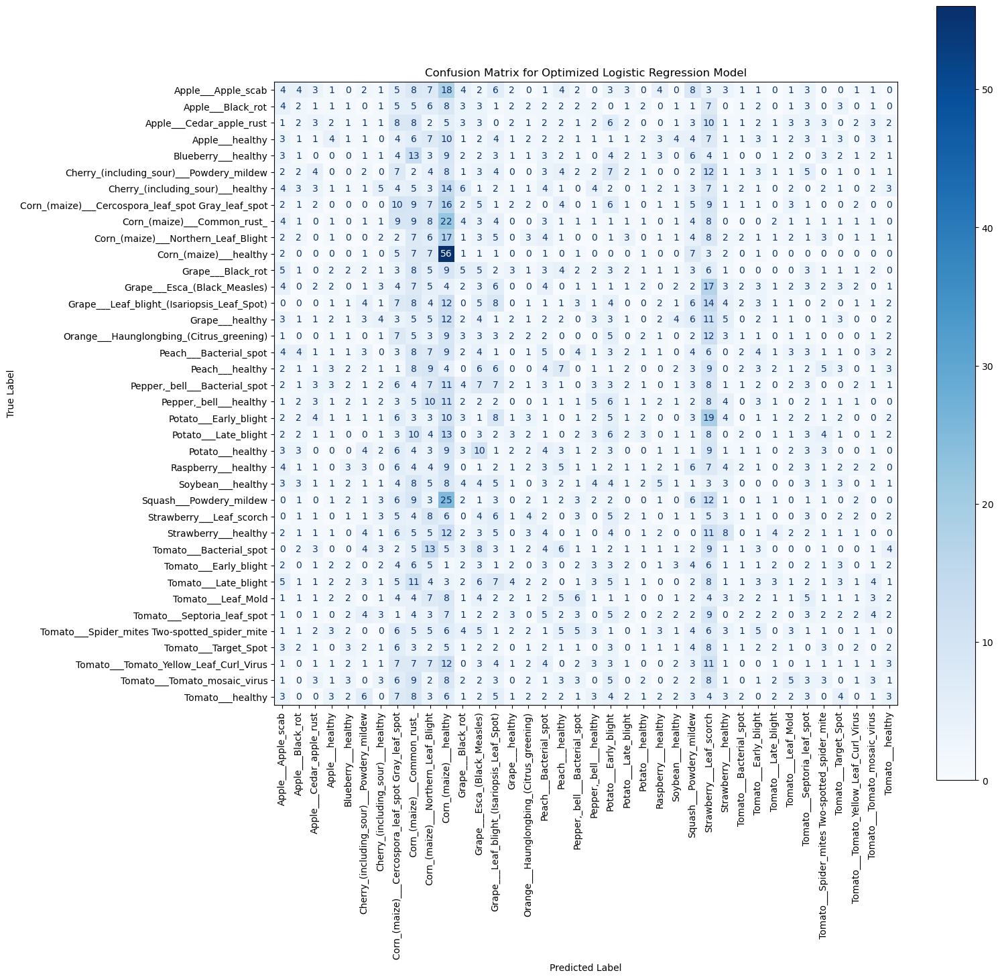

In [7]:
# Predict and evaluate the model
y_pred_lr = best_lr.predict(X_test_lda)
print(f"Optimized Logistic Regression Model Accuracy: {accuracy_score(y_test, y_pred_lr)}")
print(classification_report(y_test, y_pred_lr, target_names=label_encoder.classes_))

# Confusion Matrix for Logistic Regression Model
conf_matrix_lr = confusion_matrix(y_test, y_pred_lr)

fig, ax = plt.subplots(figsize=(15, 15))  # Increase the size of the figure
disp_lr = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_lr, display_labels=label_encoder.classes_)
disp_lr.plot(cmap=plt.cm.Blues, ax=ax, xticks_rotation='vertical')
plt.title('Confusion Matrix for Optimized Logistic Regression Model')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [8]:
print(f"Best parameters found: {grid_search_lr.best_params_}")


Best parameters found: {'C': 0.001, 'penalty': 'l2', 'solver': 'liblinear'}


# Gabor Filter + LDA + Logistic Regression

## 1. Loading and Preprocessing Data

In [3]:
# Paths
data_path = 'C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/augmented'
image_size = (64, 64)  # Resize to 64x64

# Load images and labels into memory
def load_data(data_path, image_size):
    categories = os.listdir(data_path)
    images = []
    labels = []
    for category in categories:
        category_path = os.path.join(data_path, category)
        if os.path.isdir(category_path):
            img_names = os.listdir(category_path)
            for img_name in img_names:
                img_path = os.path.join(category_path, img_name)
                img = cv2.imread(img_path)  # Read image with color
                if img is not None:
                    img = cv2.resize(img, image_size)  # Resize to 64x64
                    images.append(img)
                    labels.append(category)
    return np.array(images), np.array(labels)

# Encode labels
def encode_labels(labels, all_labels):
    label_encoder = LabelEncoder()
    label_encoder.fit(all_labels)
    return label_encoder.transform(labels), label_encoder

# Load and preprocess data
images, labels = load_data(data_path, image_size)
all_labels = [category for category in os.listdir(data_path)]
labels, label_encoder = encode_labels(labels, all_labels)

# Apply RandomUnderSampler to balance the data at the very beginning
rus = RandomUnderSampler(random_state=42)
images_resampled, labels_resampled = rus.fit_resample(images.reshape(len(images), -1), labels)

# Reshape images back to original dimensions
images_resampled = images_resampled.reshape(-1, image_size[0], image_size[1], 3)

## 2. Extracting Gabor Features

In [4]:
# Gabor filter feature extraction for color images
def extract_gabor_features(image, kernels):
    features = []
    for channel in cv2.split(image):  # Split the image into its color channels
        for kernel in kernels:
            filtered = cv2.filter2D(channel, cv2.CV_8UC3, kernel)
            features.append(filtered.mean())
            features.append(filtered.var())
    return features

def build_gabor_kernels():
    kernels = []
    ksize = 31  # Kernel size
    for theta in np.arange(0, np.pi, np.pi / 8):  # Orientations
        for sigma in (1, 3):  # Standard deviations
            for lamda in [np.pi / 4]:  # Wavelengths
                for gamma in (0.05, 0.5):  # Spatial aspect ratios
                    kernel = cv2.getGaborKernel((ksize, ksize), sigma, theta, lamda, gamma, 0, ktype=cv2.CV_32F)
                    kernels.append(kernel)
    return kernels

# Build Gabor kernels
kernels = build_gabor_kernels()

# Extract Gabor features from all images in parallel
def parallel_extract_gabor_features(images, kernels):
    with joblib.parallel_backend('threading', n_jobs=-1):
        gabor_features = Parallel(n_jobs=-1)(delayed(extract_gabor_features)(image, kernels) for image in tqdm(images, desc="Extracting Gabor Features"))
    return np.array(gabor_features)

gabor_features = parallel_extract_gabor_features(images_resampled, kernels)

# Standardize the Gabor features
scaler_gabor = StandardScaler()
gabor_features_resampled = scaler_gabor.fit_transform(gabor_features)

Extracting Gabor Features: 100%|██████████| 17328/17328 [02:09<00:00, 133.85it/s]


## 3. Dimensionality Reduction Using LDA

In [5]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(gabor_features_resampled, labels_resampled, test_size=0.2, random_state=42)

# Apply LDA to the standardized Gabor features
lda = LDA()
X_train_lda = lda.fit_transform(X_train, y_train)
X_test_lda = lda.transform(X_test)

## 4. Training and Optimizing the Logistic Regression Model

In [6]:
# Define the parameter grid for Logistic Regression
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'newton-cg', 'lbfgs', 'sag', 'saga']
}

# Initialize the GridSearchCV with LogisticRegression and the parameter grid
grid_search_lr = GridSearchCV(LogisticRegression(max_iter=10000), param_grid, refit=True, verbose=2, cv=3, n_jobs=-1)

# Use a controlled parallel backend
with joblib.parallel_backend('threading', n_jobs=-1):
    print("Starting Grid Search for Logistic Regression...")
    grid_search_lr.fit(X_train_lda, y_train)
    print("Grid Search completed.")

# Get the best estimator
best_lr = grid_search_lr.best_estimator_

Starting Grid Search for Logistic Regression...
Fitting 3 folds for each of 50 candidates, totalling 150 fits
[CV] END ...................C=0.01, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END ...............C=0.01, penalty=l1, solver=newton-cg; total time=   0.0s
[CV] END ...............C=0.01, penalty=l1, solver=newton-cg; total time=   0.0s
[CV] END ...................C=0.01, penalty=l1, solver=lbfgs; total time=   0.0s
[CV] END .....................C=0.01, penalty=l1, solver=sag; total time=   0.0s
[CV] END .....................C=0.01, penalty=l1, solver=sag; total time=   0.0s
[CV] END .....................C=0.01, penalty=l1, solver=sag; total time=   0.0s
[CV] END ...............C=0.01, penalty=l1, solver=newton-cg; total time=   0.0s
[CV] END ...............C=0.01, penalty=l1, solver=liblinear; total time=   1.5s
[CV] END ...............C=0.01, penalty=l1, solver=liblinear; total time=   1.6s


45 fits failed out of a total of 150.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\kheir\.conda\envs\PlantRecog\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\kheir\.conda\envs\PlantRecog\lib\site-packages\sklearn\linear_model\_logistic.py", line 1461, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\Users\kheir\.conda\envs\PlantRecog\lib\site-packages\sklearn\linear_model\_logistic.py", line 449, in _check_solver
    % (solver, penalty)
ValueError: Solver newton-cg supports only 'l2' or 'none' penalties

Grid Search completed.


## 5. Evaluating the Model and Visualizing the Results

Optimized Logistic Regression Model Accuracy: 0.7362954414310444
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.78      0.75      0.77       106
                                 Apple___Black_rot       0.69      0.84      0.76        76
                          Apple___Cedar_apple_rust       0.80      0.83      0.81        93
                                   Apple___healthy       0.72      0.79      0.75        95
                               Blueberry___healthy       0.85      0.93      0.89        83
          Cherry_(including_sour)___Powdery_mildew       0.68      0.73      0.71        89
                 Cherry_(including_sour)___healthy       0.89      0.84      0.86        94
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.78      0.71      0.74        96
                       Corn_(maize)___Common_rust_       0.89      0.82      0.86        97
              

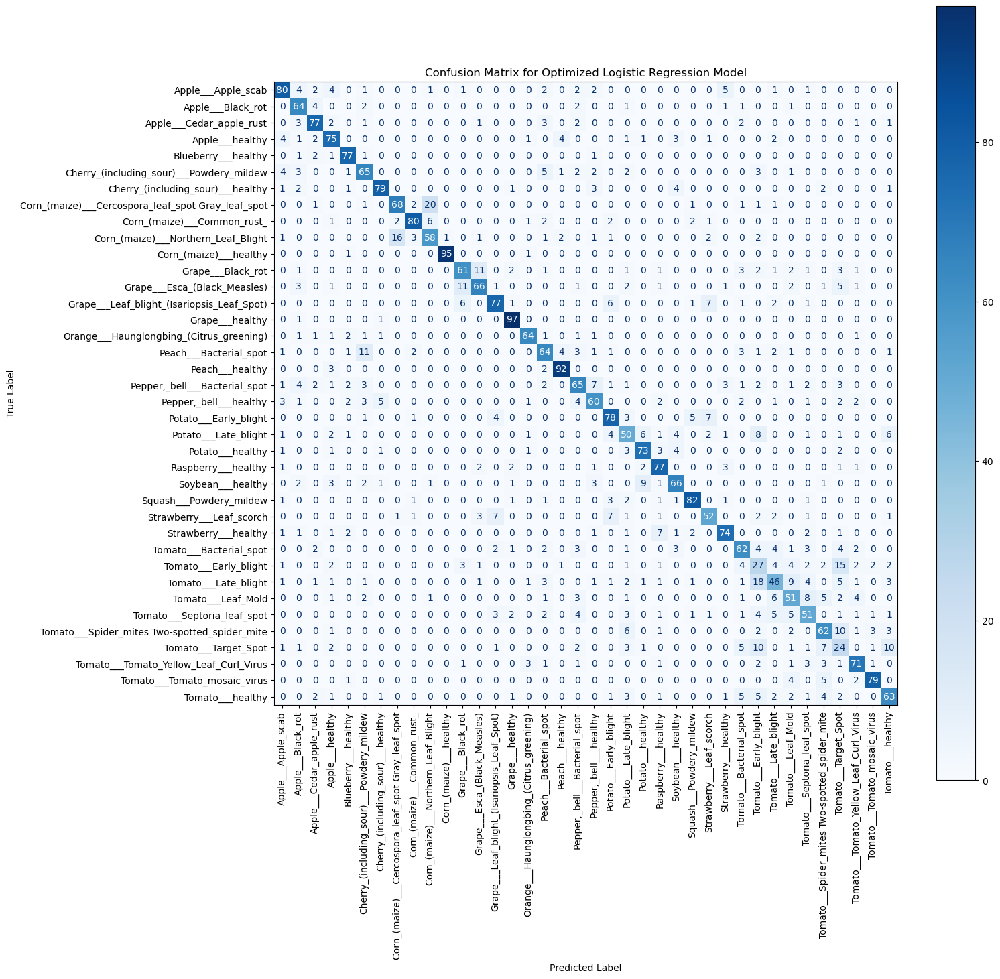

In [7]:
# Predict and evaluate the model
y_pred_lr = best_lr.predict(X_test_lda)
print(f"Optimized Logistic Regression Model Accuracy: {accuracy_score(y_test, y_pred_lr)}")
print(classification_report(y_test, y_pred_lr, target_names=label_encoder.classes_))

# Confusion Matrix for Logistic Regression Model
conf_matrix_lr = confusion_matrix(y_test, y_pred_lr)

fig, ax = plt.subplots(figsize=(15, 15))  # Increase the size of the figure
disp_lr = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_lr, display_labels=label_encoder.classes_)
disp_lr.plot(cmap=plt.cm.Blues, ax=ax, xticks_rotation='vertical')
plt.title('Confusion Matrix for Optimized Logistic Regression Model')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()